In [1]:
# imports

import numpy as np
import pandas as pd
import seaborn as sns
import xarray as xr

from matplotlib import pyplot as plt
from pathlib import Path
from tensorly.cp_tensor import CPTensor

# stop showing SettingWithCopyWarning
pd.options.mode.chained_assignment = None


In [2]:
# set aesthetic parameters

line_color = '#0F0A0A'    # dark
# line_color = '#E5E4E2'    # light

neutral_color = '#E0E0E0'

# thursday
accent_colors = ['#9B5DE5', '#FFAC69', '#00C9AE', '#FD3F92', '#0F0A0A', 
                 '#959AB1', '#FFDB66', '#63B9FF','#FFB1CA', '#4F1DD7']

style = {'axes.edgecolor': line_color,
         'axes.labelcolor': line_color,
         'text.color': line_color,
         'xtick.color': line_color,
         'ytick.color': line_color,
         'font.family': 'Helvetica',
         'font.Helvetica': ['Helvetica']}

palette = sns.color_palette(accent_colors)

sns.set_context('talk', rc={'lines.linewidth': 2})
sns.set_palette(palette)
# sns.set_palette('tab20')
sns.set_style('ticks', style)

plt.rcParams['legend.frameon'] = False
plt.rcParams['axes.spines.left'] = True
plt.rcParams['axes.spines.right'] = False
plt.rcParams['axes.spines.top'] = False
plt.rcParams['axes.spines.bottom'] = True
plt.rcParams['axes.facecolor'] = 'white'
plt.rcParams['figure.facecolor'] = 'white'
plt.rcParams['patch.linewidth'] = 0
plt.rcParams['patch.edgecolor'] = 'none'
plt.rcParams['savefig.dpi'] = 300

# clade names
clade_display_names = {
    'HLI': 'HLI', 
    'HLII': 'HLII', 
    'LLI': 'LLI', 
    '5.1A-CRD2': 'CRD2', 
    '5.1A-II': 'II', 
    '5.1A-III': 'III', 
    '5.1A-IV': 'IV', 
    '5.1A-UC-A-EnvC': 'UC-A', 
    '5.1B-CRD1': 'CRD1', 
    '5.1B-I': 'I'
}


In [3]:
# helpful functions
    
# function to select subset of indices in cp tensor
def subset_cp_tensor(cp_tensor, subset_indices):
    '''Selects subset of cp_tensor based on provided indices
    
    Parameters
    ----------
    cp_tensor : tensorly.CPTensor
        CPTensor object with (weights, factors).
    subset_indices : dict(int: index-like)
        Dictionary with mode as key and value an integer index of 
        the positions to be downselected from `cp_tensor`.
        Example: {1: [0, 1, 3, 4, 5, 8]}
        
    Returns
    -------
    subset_cp : tensorly.CPTensor
        Subset CPTensor.
    '''
    weights, factors = cp_tensor
    new_factors = factors.copy()
    for mode, index in subset_indices.items():
        new_factors[mode] = factors[mode][index]
    return(CPTensor((weights, new_factors)))

# unique bin function
def unique_bins(array, n_bins, bounds=None, reverse=False):
    '''This is a function that maps an array of continuous values with potential duplicates to 
    a set of bins in such a way that each of the original continuous values is mapped to a unique bin, and the
    distribution of binned values approximates the distribution of continuous values as closely as possible.
    
    My quick and dirty approach to this problem sorts the input array into the appropriate number of bins. Then,
    starting in the middle and alternating outward left and right, the algorithm checks to see if each bin has 
    more than one resident. If so, it will again alternate outward left and right from that position and allocate
    the extra residents to the nearest free bins.
    
    Parameters
    ----------
    array : np.array
        Sorted array of values to be placed into bins.
    n_bins : int
        Number of bins to use.
    bounds : (float, float)
        Upper and lower bounds to use for bin-mapping.
    reverse : bool
        Optional flag to reverse the index ordering of the output.
    
        
    Returns
    -------
    index : np.array
        Indices indicating mapping of input values to bins, where index[i] indicates the index of the bin 
        mapping of input value array[i] (assuming input array is sorted).
    '''
    # check number of bins
    if not n_bins >= len(array):
        raise ValueError('The number of bins must be >= len(array).')
    # add bounds if supplied
    if bounds is not None:
        array = np.concatenate((array, bounds))
    # make histogram
    counts, _ = np.histogram(array, bins=n_bins)
    # remove bounds if added
    if bounds is not None:
        counts[0] -= 1
        counts[-1] -= 1
    # start from the middle
    i = int(n_bins/2)
    for j in range(n_bins):
        # alternate left and right
        if j % 2:
            i -= j
        else:
            i += j
        # resolve collisions
        if counts[i] > 1:
            # set new counter for exploring nearby positions
            k = i
            for l in range(2*n_bins):
                # alternate left and right
                if l % 2:
                    k -= l
                else:
                    k += l
                # check if we're still in range
                if 0 <= k < n_bins:
                    # check for an empty spot
                    if counts[k] == 0:
                        counts[k] = 1
                        counts[i] -= 1
                        # check if all collisions have been resolved yet
                        if counts[i] == 1:
                            break
    # select indices of non-zero values
    index = np.where(counts == 1)[0]
    # reverse if requested
    if reverse:
        index = (n_bins - 1) - index
    return index


# import data

In [4]:
# read in aligned model datasets

datapath = Path('../../data/')

pro_ds = xr.open_dataset(datapath / '5-models/pro-aligned-models.nc')
syn_ds = xr.open_dataset(datapath / '5-models/syn-aligned-models.nc')

pro_ds


<xarray.Dataset>
Dimensions:          (Bootstrap: 100, Replicate: 3, Component: 15,
                      Ortholog: 5023, Clade: 3, SampleName: 74)
Coordinates:
  * Bootstrap        (Bootstrap) int64 0 1 2 3 4 5 6 7 ... 93 94 95 96 97 98 99
  * Replicate        (Replicate) object 'A' 'B' 'C'
  * Component        (Component) int64 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15
  * Ortholog         (Ortholog) int64 60000001 60000002 ... 60040287 60040292
  * Clade            (Clade) object 'HLI' 'HLII' 'LLI'
  * SampleName       (SampleName) object 'G1.SURF.NS.S02C1.15m' ... 'G3.UW.NS...
Data variables:
    ComponentWeight  (Bootstrap, Replicate, Component) float64 ...
    GeneWeight       (Bootstrap, Replicate, Component, Ortholog) float64 ...
    TaxonWeight      (Bootstrap, Replicate, Component, Clade) float64 ...
    SampleWeight     (Bootstrap, Replicate, Component, SampleName) float64 ...
    Sample           (Bootstrap, Replicate, SampleName) object ...
    Annotation       (Ortholog) object ...
Attributes:
    Rank:               15
    Lambda:             17.0
    AlignRefBootstrap:  93
    AlignRefReplicate:  B

In [5]:
# fetch sample metatdata and shuffled sample label inputs

metadata_df = pd.read_csv(datapath / 'metadata/sample_metadata_merged.csv').fillna('')
metadata_df['Datetime'] = pd.to_datetime(metadata_df['Datetime'], format='%m/%d/%y %H:%M')

metadata_df


,SampleName,Cruise,Year,Datetime,Latitude,Longitude,Depth,Dataset,SampleGroup,TimeFraction,TimeClass,Experiment,Condition,Treatment,Timepoint
0,G2.DCM.NS.S11C2.50m,Gradients 2,2017,2017-06-06 06:56:00,36.999833,-158.000,50,Gradients 2 DCM,depth profiles,0.29,6am,,,,
1,G2.DCM.NS.S15C2.56m,Gradients 2,2017,2017-06-09 05:30:00,34.000167,-158.000,56,Gradients 2 DCM,depth profiles,0.23,6am,,,,
2,G2.DCM.NS.S17C3.87m,Gradients 2,2017,2017-06-10 09:34:00,32.000167,-158.000,87,Gradients 2 DCM,depth profiles,0.40,10am,,,,
3,G2.DCM.NS.S18C2.95m,Gradients 2,2017,2017-06-11 05:50:00,29.582000,-158.002,95,Gradients 2 DCM,depth profiles,0.24,6am,,,,
4,G3.DEPTH.NS.S4C6.75m,Gradients 3,2019,2019-04-16 08:00:00,41.670000,-158.050,75,Gradients 3 depth profile,depth profiles,0.33,10am,,,,
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
82,G3.DEPTH.NS.S6C7.15m,Gradients 3,2019,2019-04-22 06:44:00,32.920000,-158.000,15,Gradients 3 depth profile,surface transect,0.28,6am,,,,
83,G3.UW.NS.UW40_1.7m,Gradients 3,2019,2019-04-24 05:57:00,40.880000,-158.000,7,Gradients 3 underway,surface transect,0.25,6am,,,,
84,G3.DEPTH.NS.S8C2.15m,Gradients 3,2019,2019-04-24 14:47:00,42.330000,-158.000,15,Gradients 3 depth profile,surface transect,0.62,2pm,,,,
85,G3.UW.NS.UW40_2.7m,Gradients 3,2019,2019-04-25 06:01:00,40.090000,-158.000,7,Gradients 3 underway,surface transect,0.25,6am,,,,


# _Prochlorococcus_ clusters

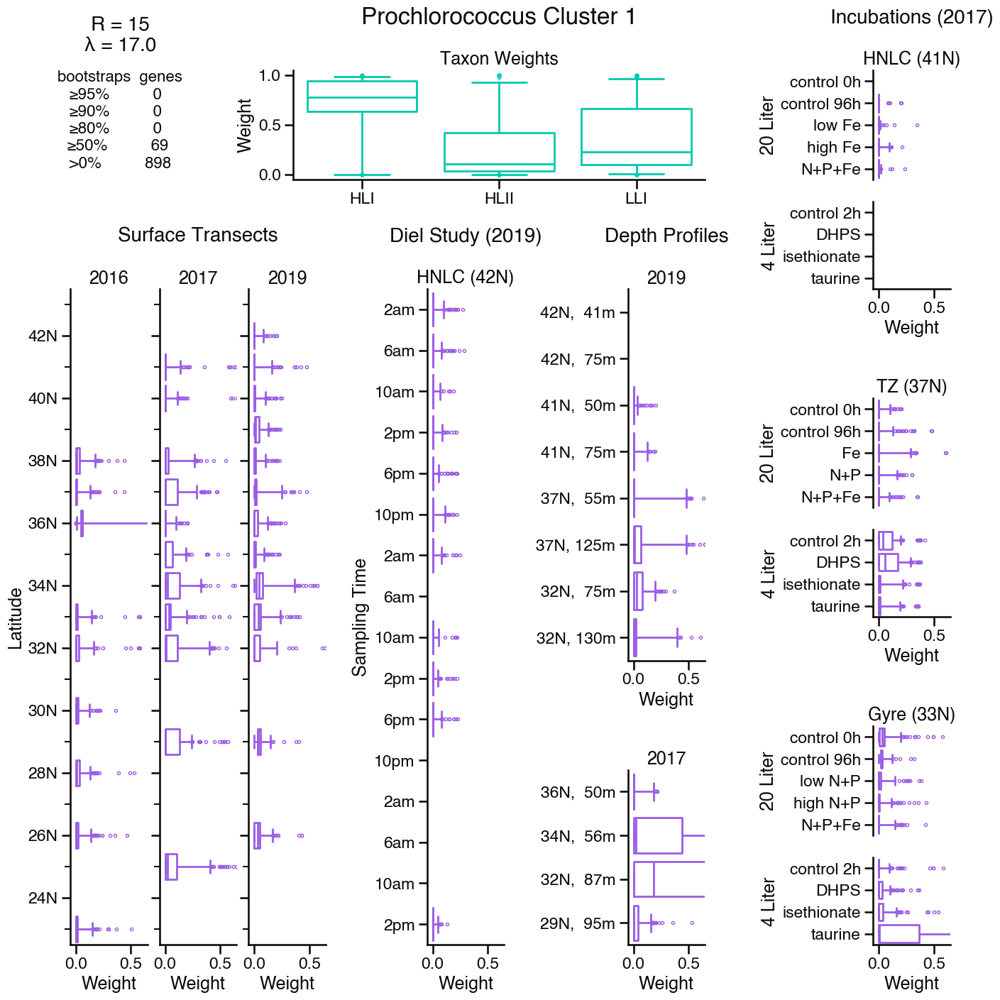

,Ortholog,MedianWeight,BootstrapSupport,Annotation
0,60000394,0.120875,0.606667,Dipeptidyl aminopeptidase/acylaminoacyl peptidase
1,60000877,0.118408,0.593333,transcription-repair coupling factor (superfam...
2,60000484,0.098967,0.603333,cell division protein FtsI (penicillin-binding...
3,60000207,0.093235,0.606667,S-adenosylmethionine:tRNA ribosyltransferase-i...
4,60000317,0.092164,0.600000,phosphate:acyl-[acyl carrier protein] acyltran...
5,60000602,0.089688,0.600000,spermidine synthase
6,60000607,0.085259,0.596667,Apolipoprotein N-acyltransferase
7,60000783,0.084408,0.606667,cell division protein FtsW
8,60000822,0.083149,0.580000,glutamate 5-kinase
9,60000277,0.073681,0.606667,Phosphomannomutase


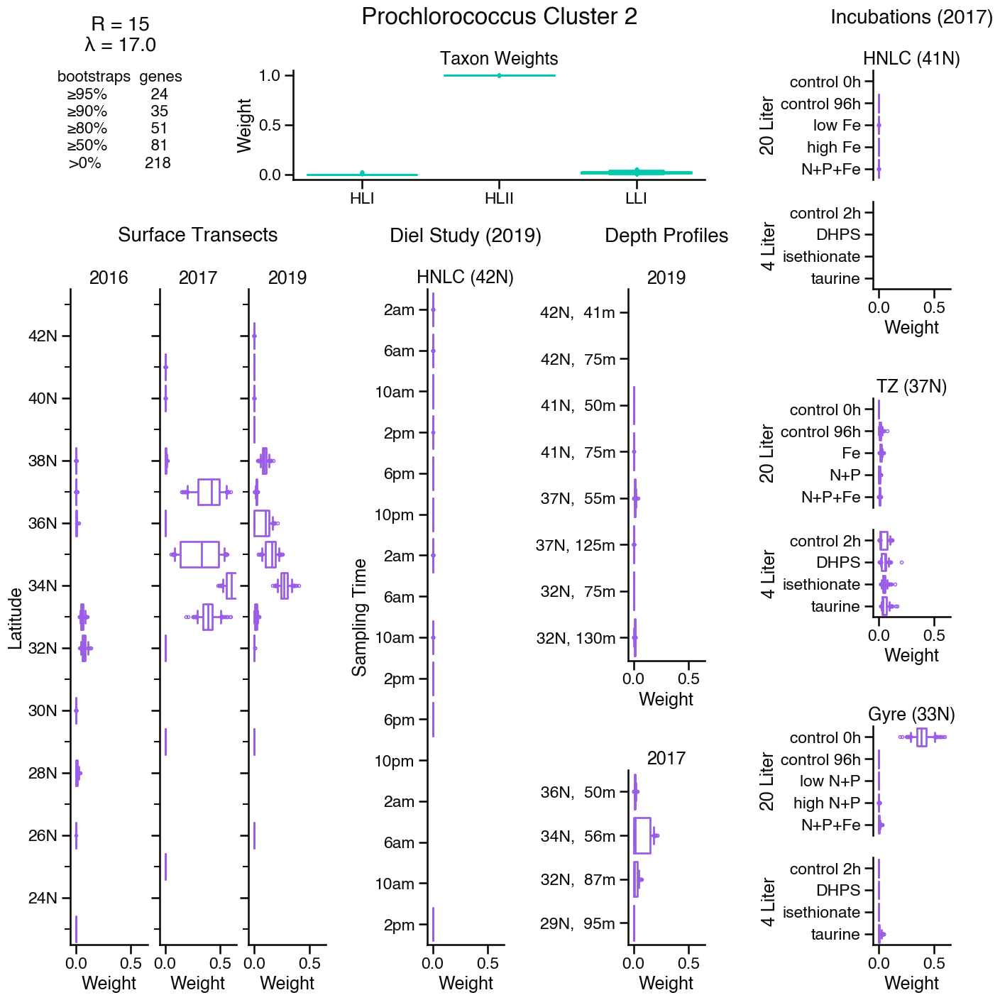

,Ortholog,MedianWeight,BootstrapSupport,Annotation
0,60001478,0.238956,0.983333,hypothetical protein
1,60002435,0.233022,0.986667,type I restriction enzyme M protein
2,60002260,0.231592,0.986667,autotransporter-associated beta strand repeat-...
3,60003365,0.227942,0.986667,hypothetical protein
4,60001376,0.203686,0.990000,Tetratricopeptide repeat-containing protein
5,60003165,0.184084,0.980000,hypothetical protein
6,60001332,0.173008,0.933333,"GDPmannose 4,6-dehydratase"
7,60002443,0.167525,0.976667,Hemolysin activation/secretion protein
8,60000126,0.166173,0.983333,UDPglucose 6-dehydrogenase
9,60001490,0.163093,0.943333,"ATP-binding cassette, subfamily B"


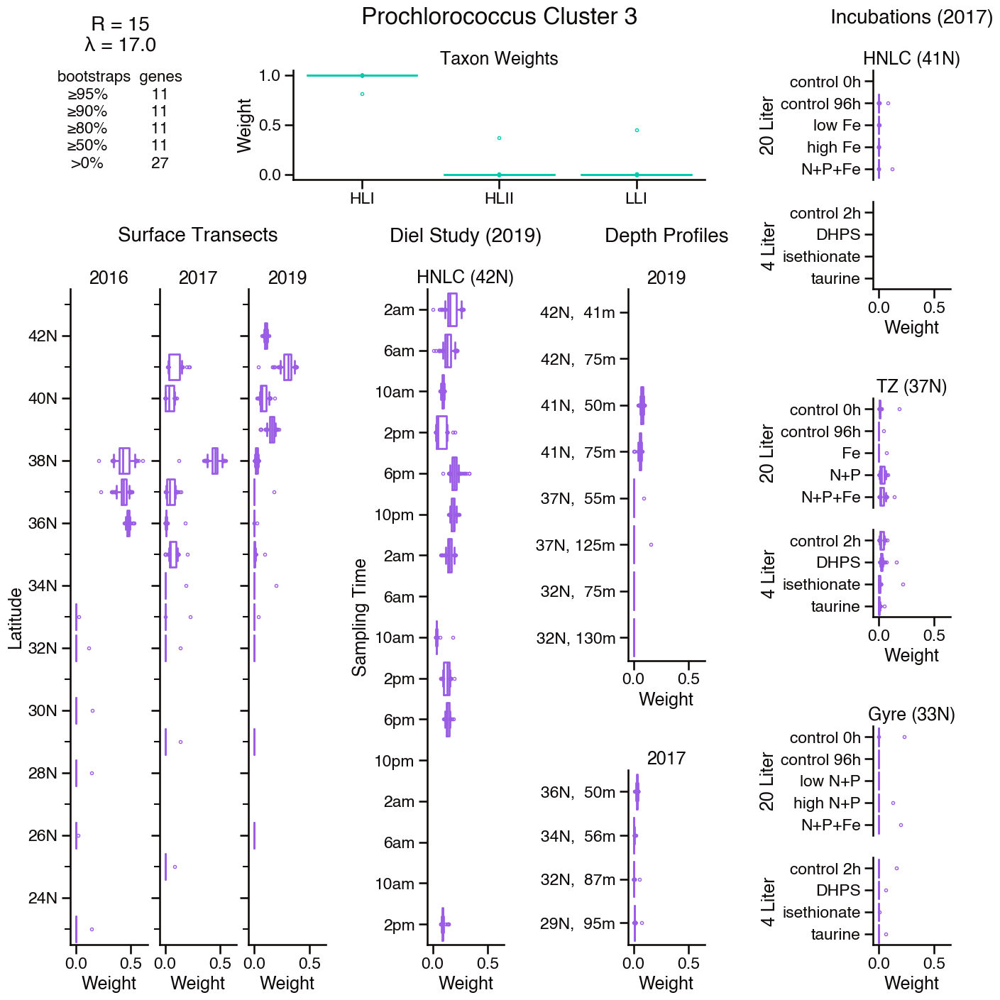

,Ortholog,MedianWeight,BootstrapSupport,Annotation
0,60022546,0.486309,0.963333,elongation factor 4
1,60019896,0.454884,0.993333,KH domain-containing protein
2,60036903,0.394047,0.970000,elongation factor 4
3,60019899,0.333521,0.996667,MFS_1 like family protein
4,60026976,0.243086,0.996667,TatD DNase family protein
5,60003126,0.227976,0.986667,ATP-dependent RNA helicase RhlE
6,60019894,0.204869,0.996667,U4/U6 small ribonucleoprotein PRP3
7,60023492,0.197730,0.996667,hypothetical protein
8,60019897,0.187539,0.996667,Kinase associated domain 1
9,60019895,0.151733,0.983333,SAP domain-containing protein


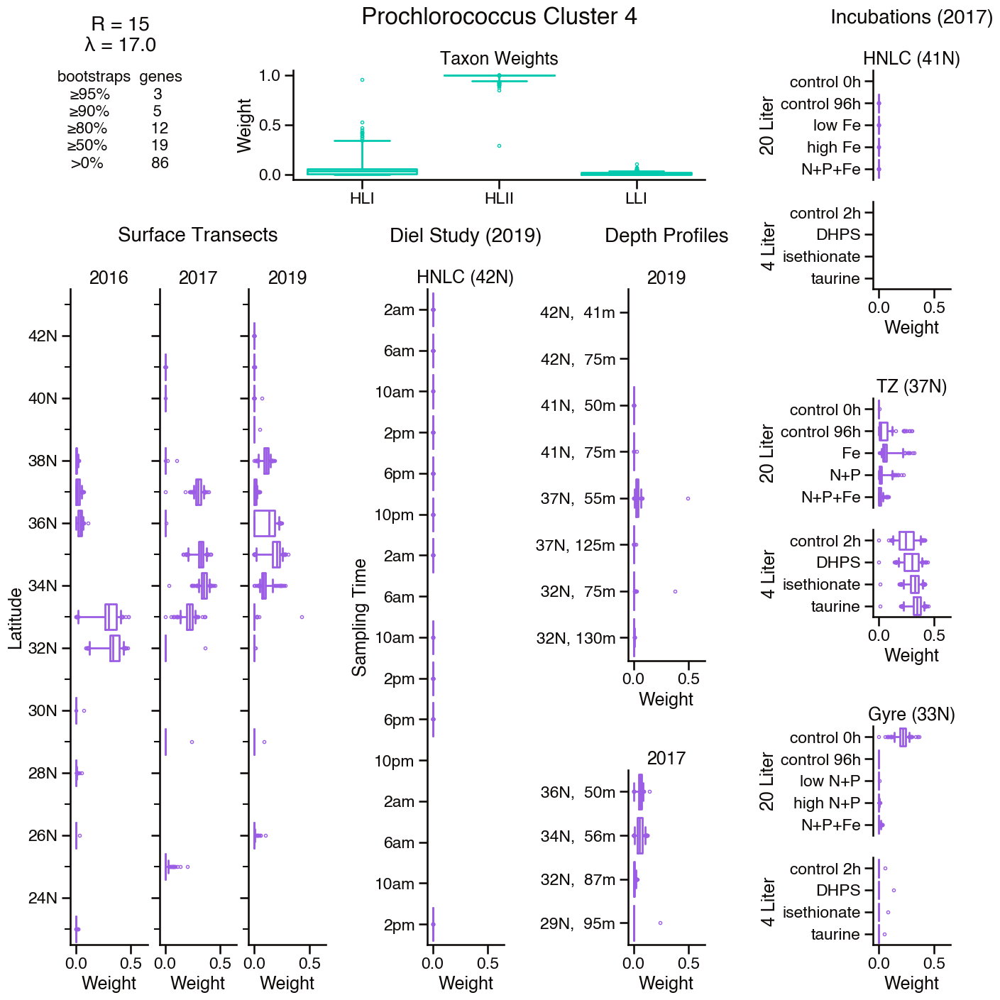

,Ortholog,MedianWeight,BootstrapSupport,Annotation
0,60002365,0.448345,0.996667,hypothetical protein
1,60019241,0.369554,0.930000,"phage prohead protease, HK97 family/phage majo..."
2,60001792,0.352009,0.960000,hypothetical protein
3,60001883,0.289594,0.963333,protein of unknown function (DUF4214)
4,60008638,0.284004,0.870000,hypothetical protein
5,60001866,0.258365,0.823333,hypothetical protein
6,60000689,0.257525,0.933333,"SOS-response transcriptional repressor, LexA"
7,60001845,0.138140,0.816667,Invasin beta-domain of outer membrane
8,60001535,0.131278,0.866667,protein of unknown function (DUF4278)
9,60001830,0.128499,0.830000,hypothetical protein


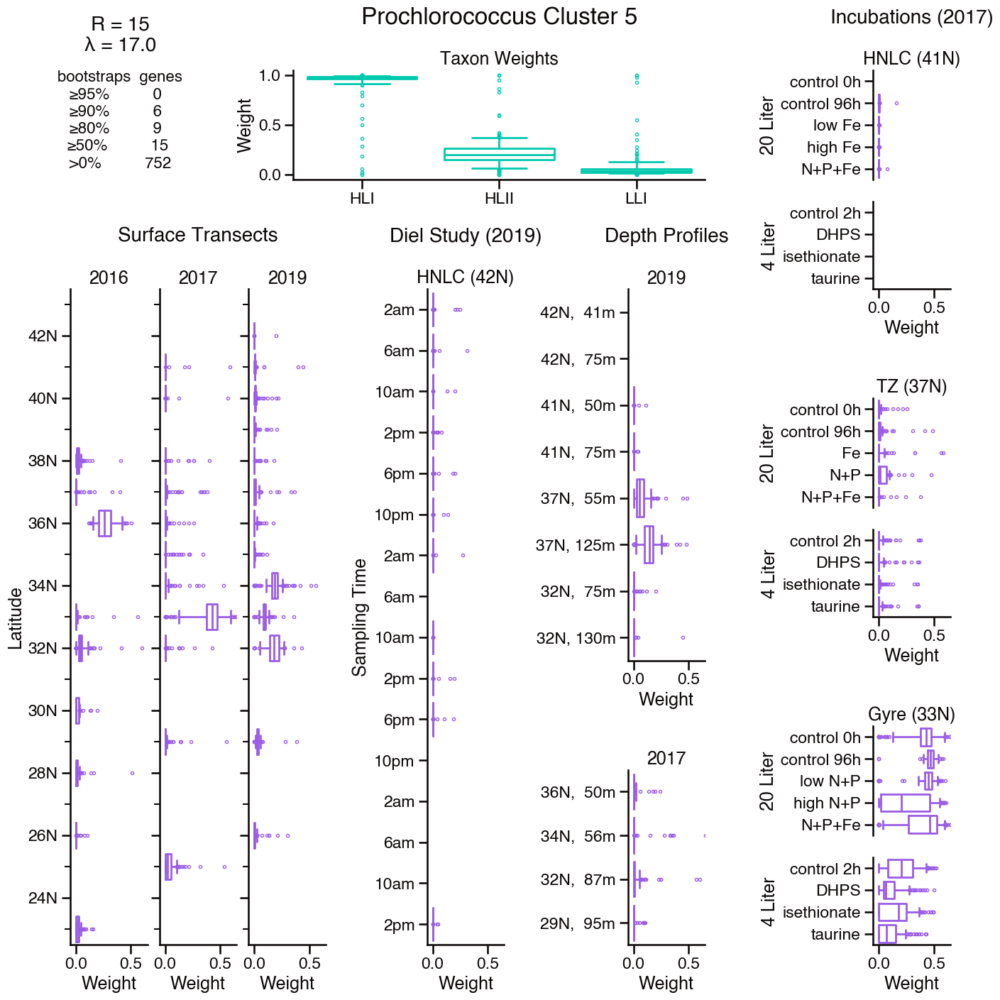

,Ortholog,MedianWeight,BootstrapSupport,Annotation
0,60000034,0.409490,0.856667,hypothetical protein
1,60001812,0.404264,0.930000,hypothetical protein
2,60001613,0.351748,0.920000,hypothetical protein
3,60001855,0.333174,0.920000,hypothetical protein
4,60001584,0.320278,0.913333,hypothetical protein
5,60001044,0.317464,0.913333,hypothetical protein
6,60001258,0.214278,0.846667,hypothetical protein
7,60000403,0.193992,0.910000,cysteine synthase
8,60001452,0.091436,0.806667,hypothetical protein
9,60000285,0.079081,0.713333,hypothetical protein


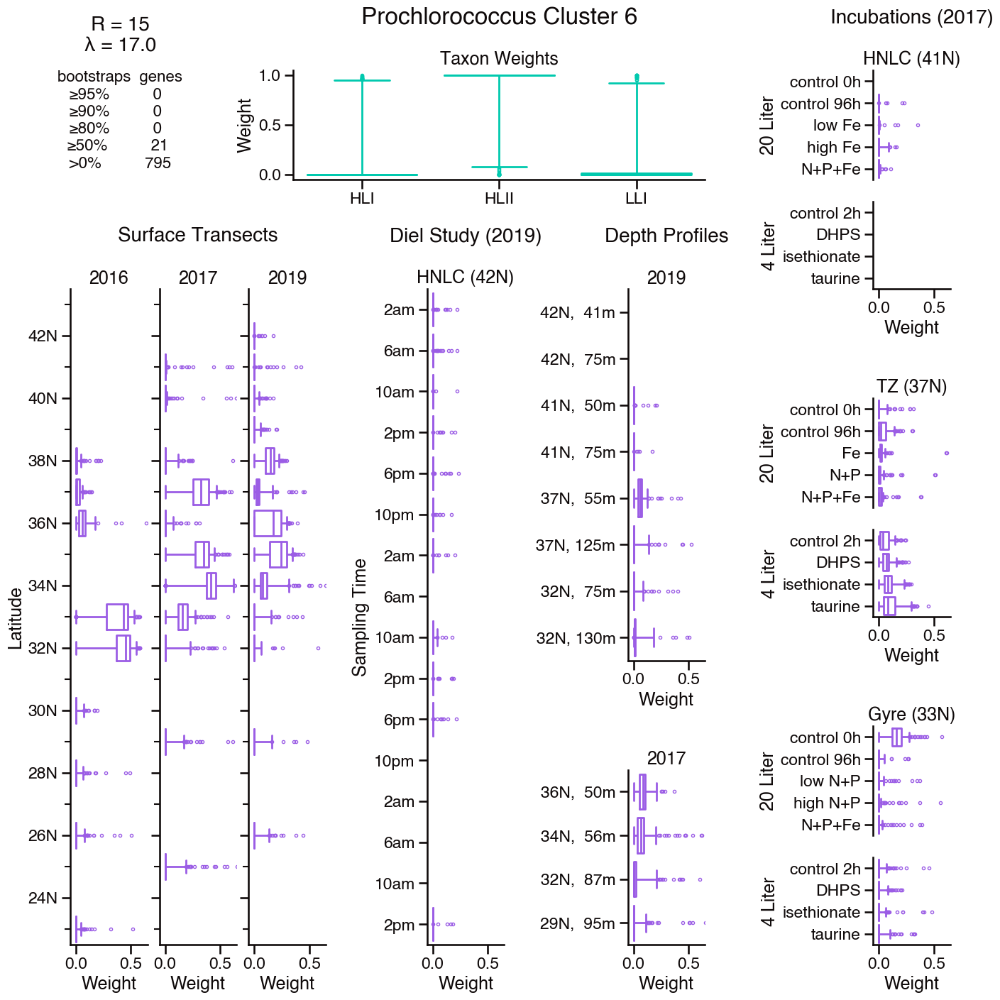

,Ortholog,MedianWeight,BootstrapSupport,Annotation
0,60007541,0.329925,0.730000,hypothetical protein
1,60002870,0.329530,0.770000,Curli biogenesis system outer membrane secreti...
2,60003513,0.259855,0.743333,hypothetical protein
3,60000653,0.243053,0.780000,ornithine carbamoyltransferase
4,60003808,0.220953,0.783333,hypothetical protein
5,60001845,0.163523,0.676667,Invasin beta-domain of outer membrane
6,60001866,0.121464,0.646667,hypothetical protein
7,60000252,0.116617,0.733333,hypothetical protein
8,60000459,0.072129,0.636667,membrane protease FtsH catalytic subunit
9,60019241,0.048426,0.563333,"phage prohead protease, HK97 family/phage majo..."


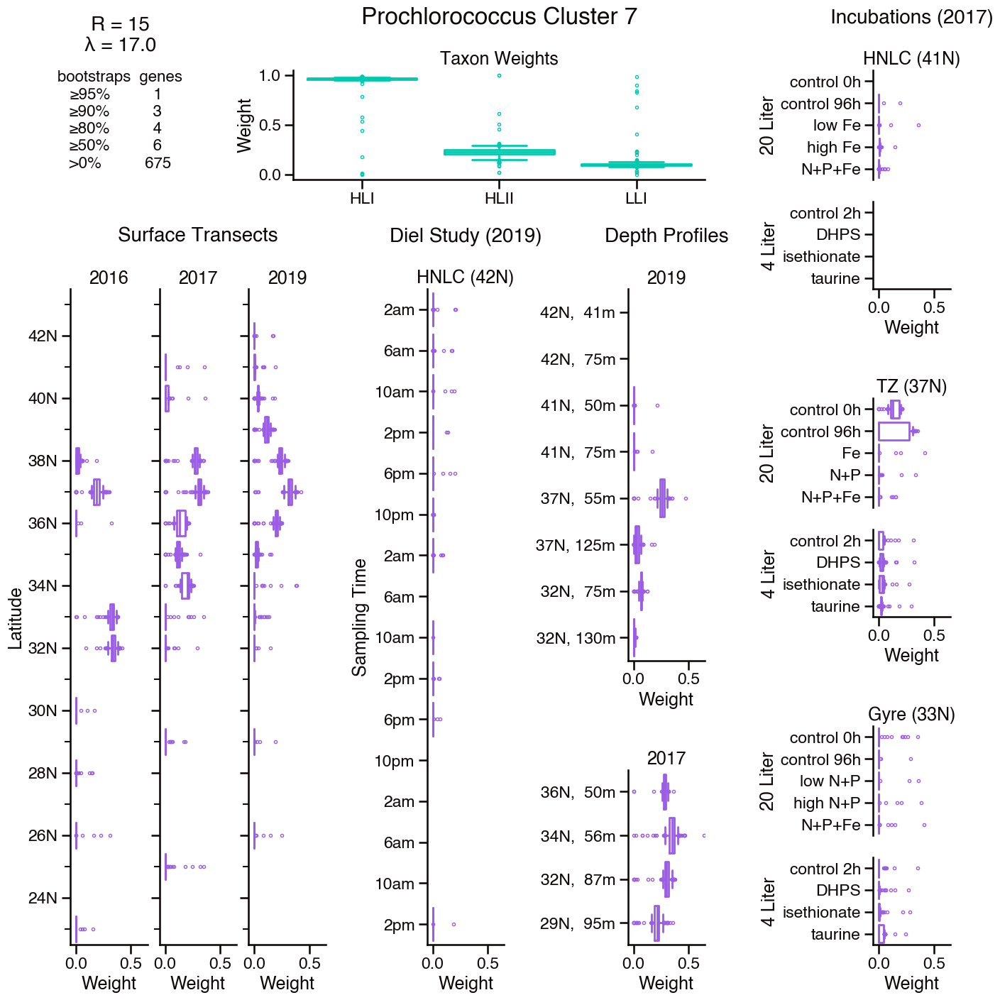

,Ortholog,MedianWeight,BootstrapSupport,Annotation
0,60001290,0.757375,0.966667,fructose-bisphosphate aldolase
1,60001112,0.588871,0.946667,flavodoxin I
2,60000706,0.223491,0.920000,iron(III) transport system substrate-binding p...
3,60000134,0.085240,0.756667,RNA polymerase nonessential primary-like sigma...
4,60000023,0.070026,0.873333,chlorophyll a/b binding light-harvesting prote...
5,60001361,0.005717,0.546667,ribulose-5-phosphate 3-epimerase


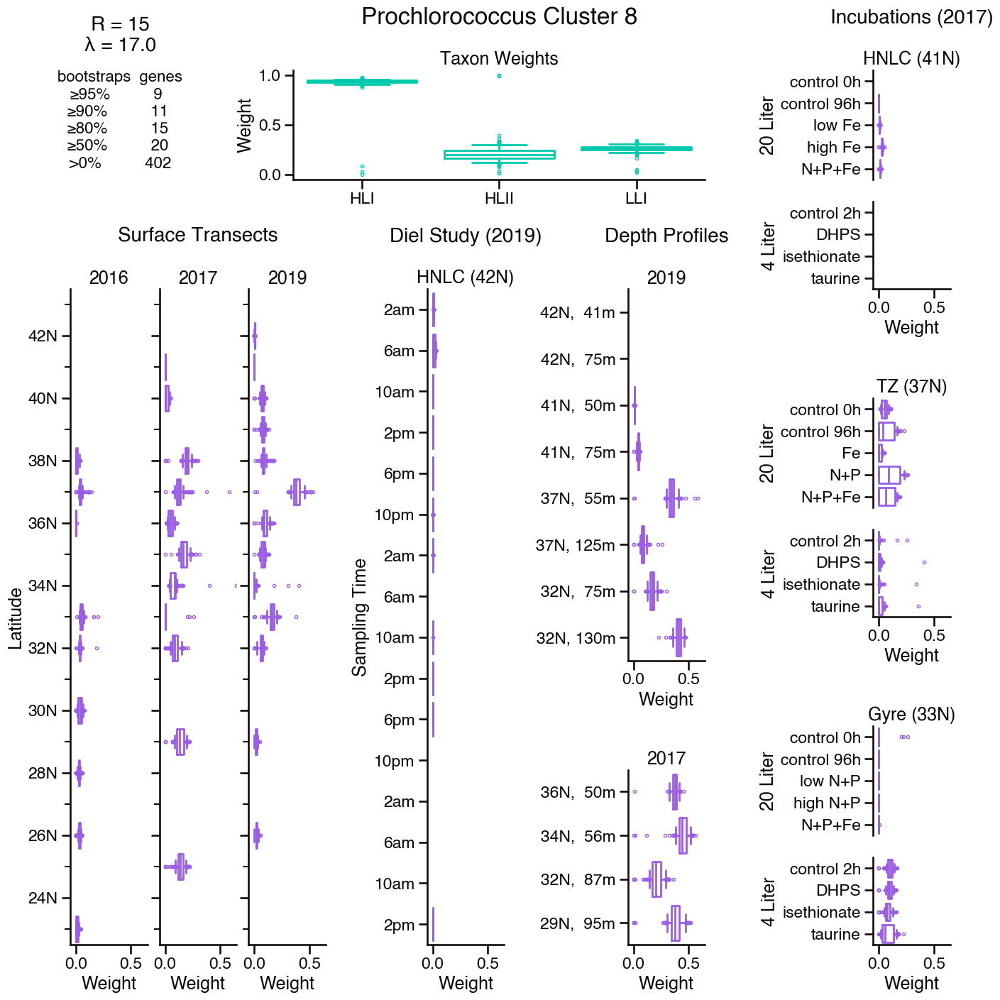

,Ortholog,MedianWeight,BootstrapSupport,Annotation
0,60000979,0.488353,0.986667,BMC domain-containing protein
1,60001081,0.465861,0.986667,"ribulose 1,5-bisphosphate carboxylase small su..."
2,60000811,0.439646,0.986667,Carboxysome shell peptide mid-region
3,60000978,0.404280,0.986667,"ribulose 1,5-bisphosphate carboxylase large su..."
4,60000726,0.195899,0.983333,F-type H+-transporting ATPase subunit b
5,60000742,0.147768,0.950000,ATP synthase F0 subcomplex B' subunit
6,60000138,0.140954,0.983333,ATP synthase F1 subcomplex beta subunit
7,60000052,0.097839,0.966667,transketolase
8,60000833,0.088110,0.960000,ATP synthase F0 subcomplex C subunit
9,60000381,0.086948,0.806667,glyceraldehyde 3-phosphate dehydrogenase (NADP+)


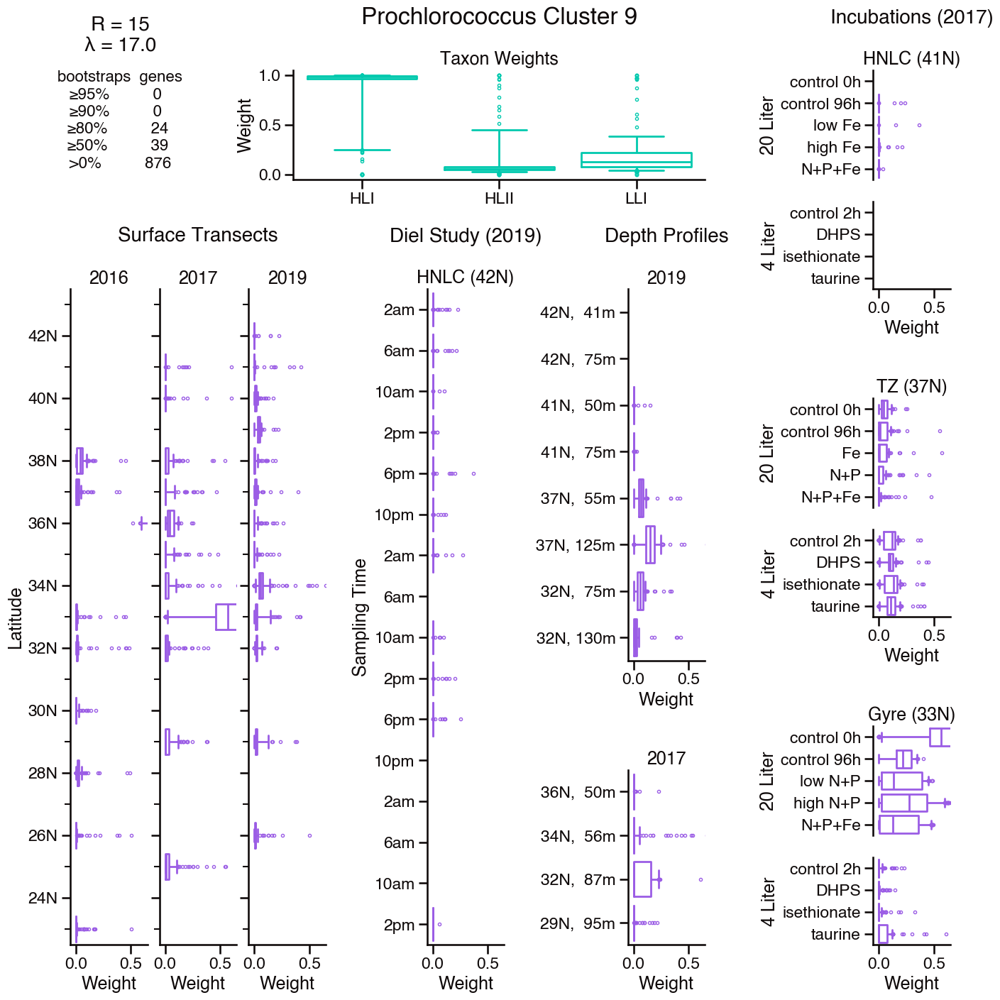

,Ortholog,MedianWeight,BootstrapSupport,Annotation
0,60000720,0.282076,0.853333,"ribonucleotide reductase, class II"
1,60000055,0.263211,0.863333,hydroxymethylpyrimidine synthase
2,60000041,0.234992,0.850000,cytochrome c oxidase subunit 1
3,60000696,0.214641,0.860000,NAD(P) transhydrogenase subunit alpha
4,60000362,0.206784,0.870000,RNA polymerase primary sigma factor
5,60000563,0.197238,0.810000,L-glutamine synthetase
6,60000835,0.189146,0.863333,"RNA polymerase sigma factor, sigma-70 family"
7,60000595,0.183855,0.850000,transaldolase
8,60000247,0.183149,0.866667,NADH dehydrogenase subunit M
9,60000376,0.181656,0.836667,cell division protein FtsZ


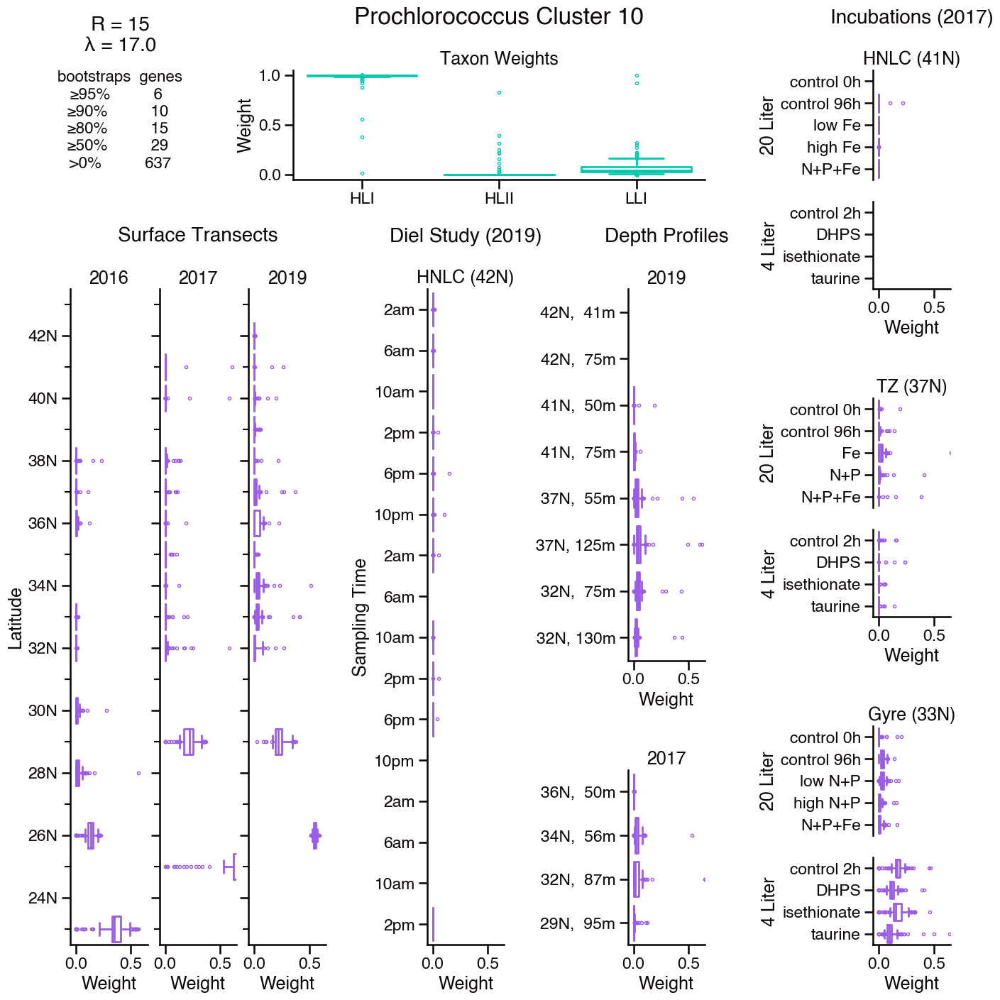

,Ortholog,MedianWeight,BootstrapSupport,Annotation
0,60004522,0.378799,0.950000,protein of unknown function (DUF4278)
1,60002660,0.368676,0.953333,photosystem II oxygen-evolving enhancer protein 1
2,60000035,0.350118,0.953333,phosphate ABC transporter substrate-binding pr...
3,60007828,0.288681,0.946667,hypothetical protein
4,60001362,0.261556,0.963333,Major Facilitator Superfamily protein
5,60000280,0.249555,0.923333,Protein of unknown function (DUF3155)
6,60000252,0.244983,0.953333,hypothetical protein
7,60000197,0.239740,0.956667,pyruvate dehydrogenase E2 component (dihydroli...
8,60003282,0.162100,0.946667,hypothetical protein
9,60007541,0.161132,0.916667,hypothetical protein


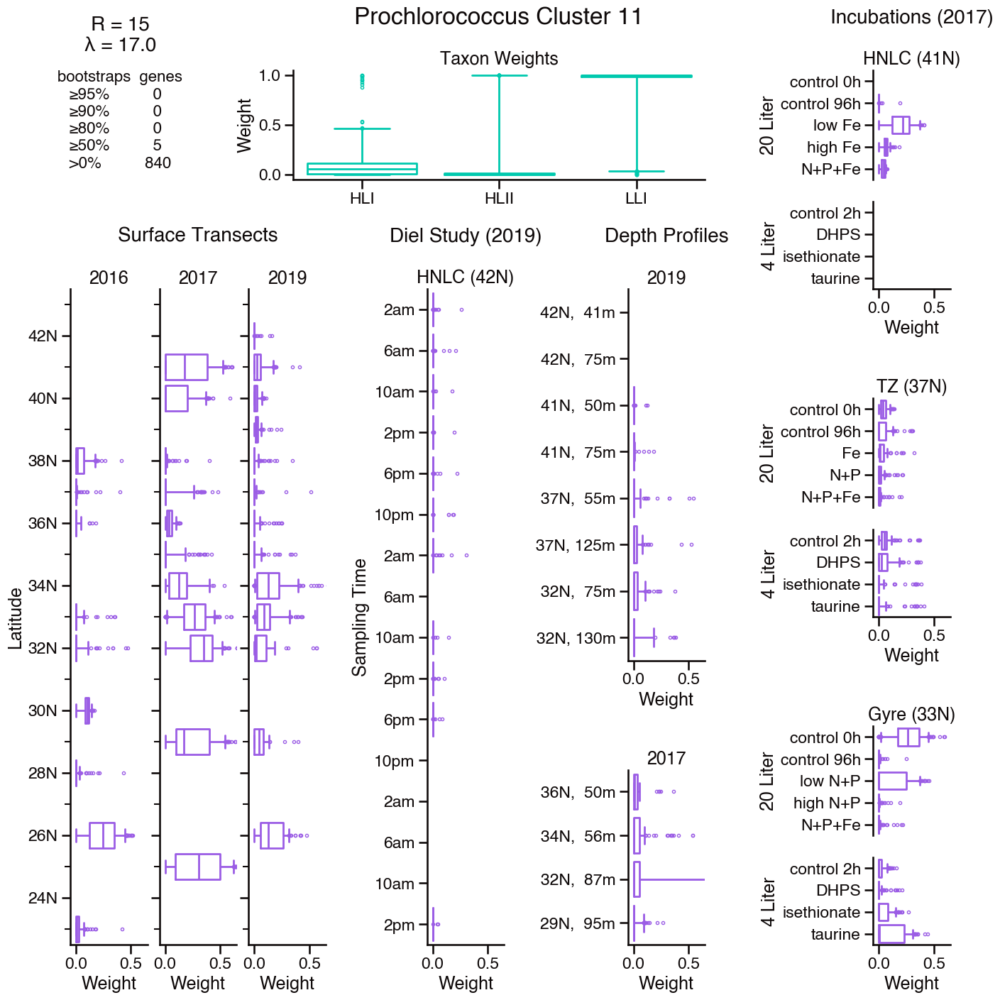

,Ortholog,MedianWeight,BootstrapSupport,Annotation
0,60039089,0.574341,0.750000,hypothetical protein
1,60002365,0.486983,0.783333,hypothetical protein
2,60002595,0.062597,0.533333,hypothetical protein
3,60001259,0.021139,0.520000,Tetratricopeptide repeat-containing protein
4,60001501,0.015602,0.523333,ribosomal large subunit pseudouridine synthase F


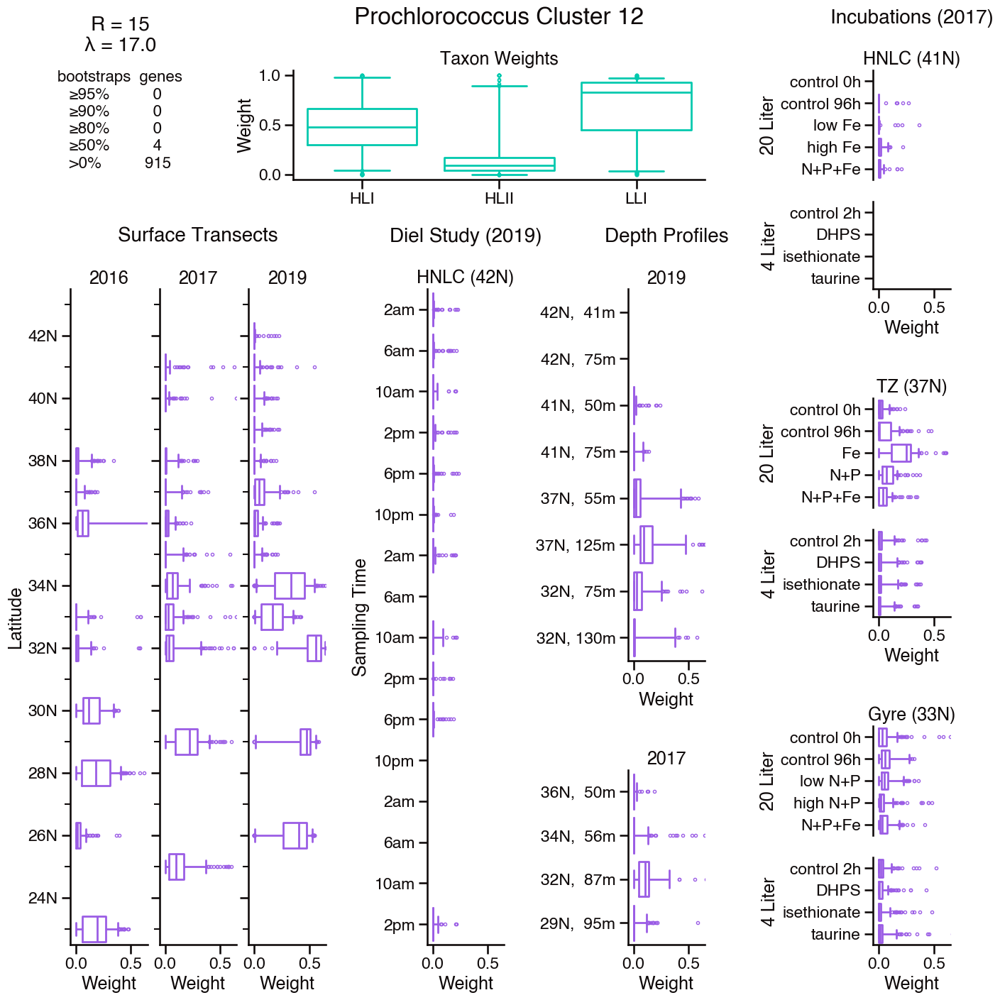

,Ortholog,MedianWeight,BootstrapSupport,Annotation
0,60001535,0.556990,0.750000,protein of unknown function (DUF4278)
1,60004522,0.357194,0.663333,protein of unknown function (DUF4278)
2,60001258,0.196015,0.640000,hypothetical protein
3,60001931,0.052173,0.560000,hypothetical protein


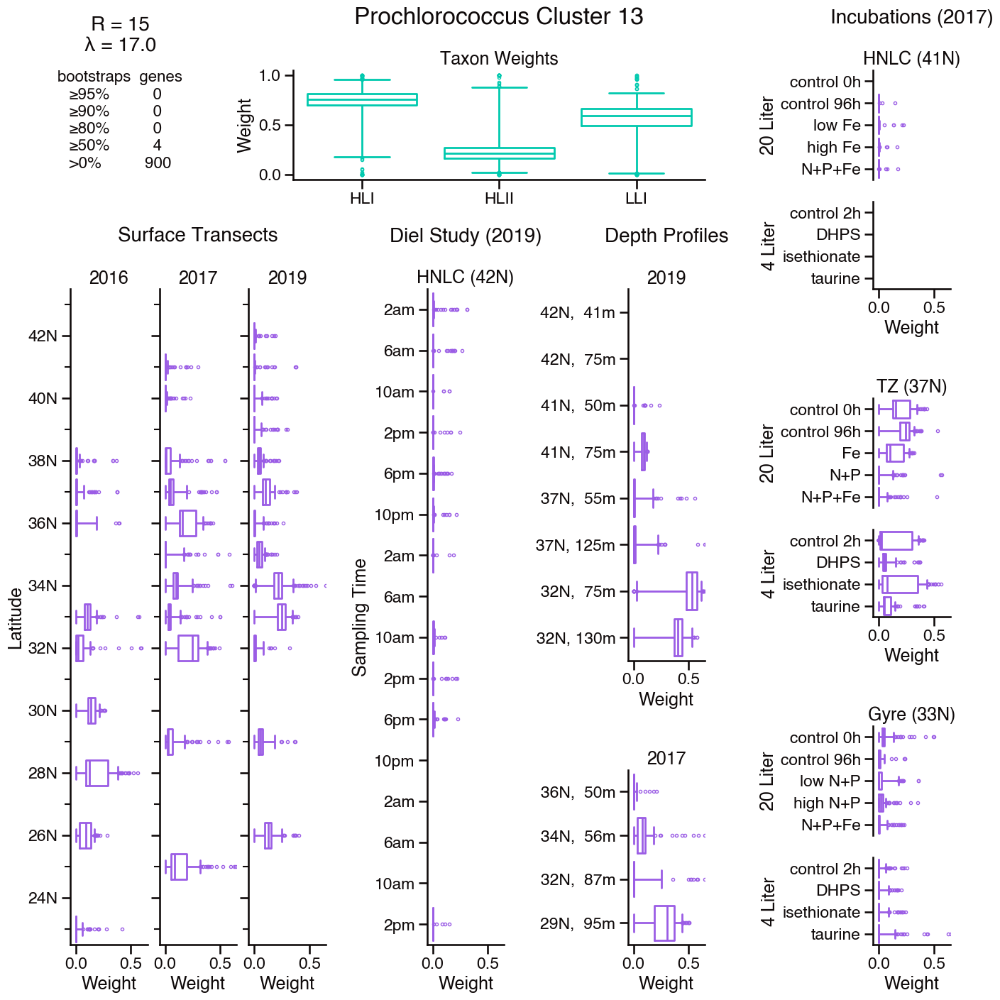

,Ortholog,MedianWeight,BootstrapSupport,Annotation
0,60001296,0.838669,0.786667,urea-binding protein
1,60000113,0.439057,0.790000,ammonium transporter
2,60001300,0.001840,0.506667,urea ABC transporter membrane protein
3,60004671,0.001813,0.506667,taurine transport system substrate-binding pro...


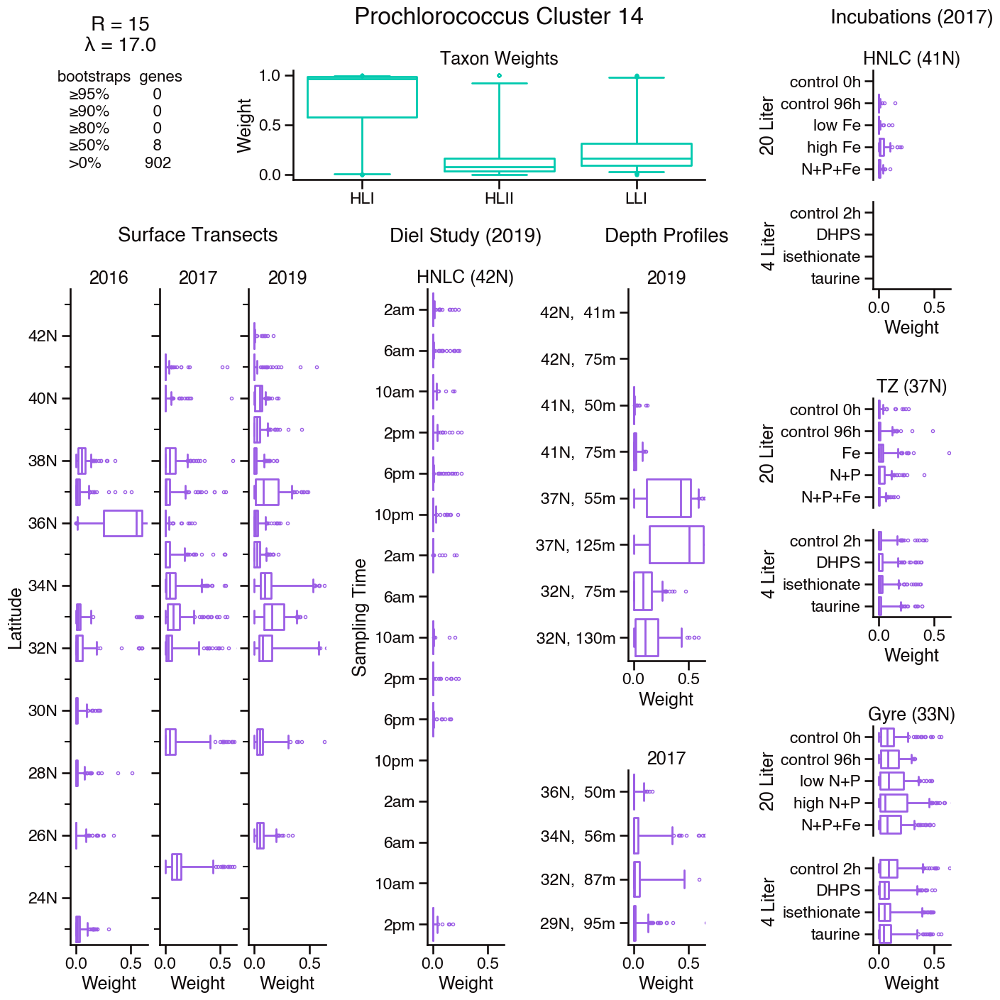

,Ortholog,MedianWeight,BootstrapSupport,Annotation
0,60000459,0.230165,0.696667,membrane protease FtsH catalytic subunit
1,60000285,0.159040,0.623333,hypothetical protein
2,60000002,0.113695,0.596667,ATP-dependent Clp protease ATP-binding subunit...
3,60000403,0.109811,0.593333,cysteine synthase
4,60000123,0.090195,0.540000,molecular chaperone DnaK
5,60000140,0.010587,0.506667,ribonuclease J
6,60000027,0.007686,0.506667,hypothetical protein
7,60000157,0.004712,0.503333,adenosylhomocysteinase


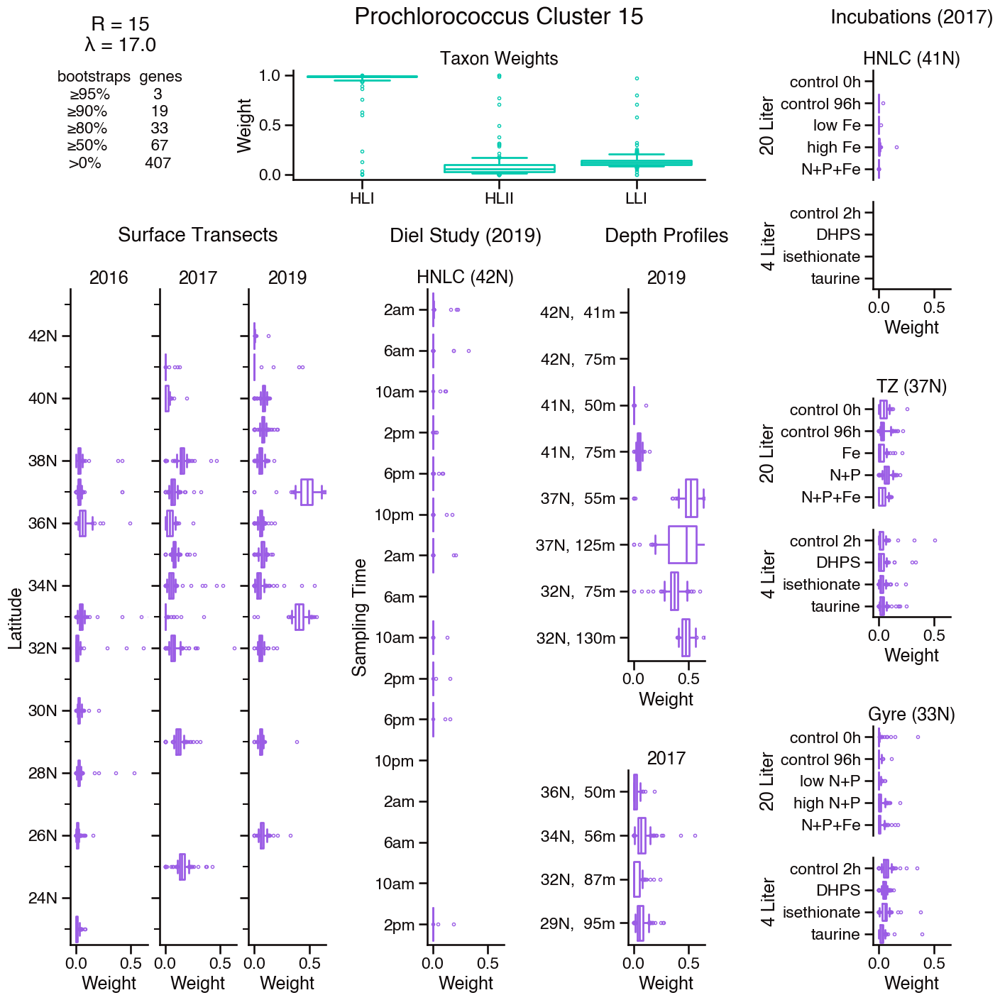

,Ortholog,MedianWeight,BootstrapSupport,Annotation
0,60000650,0.227396,0.863333,photosystem I subunit 3
1,60000004,0.226189,0.936667,hypothetical protein
2,60001287,0.220211,0.746667,fructose-bisphosphate aldolase
3,60000242,0.216953,0.943333,polyribonucleotide nucleotidyltransferase
4,60001181,0.211529,0.963333,photosystem II oxygen-evolving enhancer protein 1
5,60000507,0.204299,0.923333,ATP synthase F1 subcomplex alpha subunit
6,60000049,0.202688,0.953333,translation elongation factor 2 (EF-2/EF-G)
7,60000288,0.200982,0.876667,photosystem II CP47 chlorophyll apoprotein
8,60000050,0.199369,0.920000,"sulfate permease, SulP family"
9,60001228,0.166967,0.836667,Pentapeptide repeat-containing protein


In [6]:
# plot and save Pro clusters

# data and figure specs
genus = 'pro'
ds = {'pro': pro_ds, 'syn': syn_ds}[genus]
rank = ds.Rank
lamb = ds.Lambda
rows = 40
cols = 40
clade_color = {'pro': sns.color_palette()[2], 'syn': sns.color_palette()[3]}[genus]
sample_color = sns.color_palette()[0]
annot_kwgs = {
    'xycoords': 'axes fraction', 'va': 'center', 'ha': 'left', 'fontsize': 22, 'annotation_clip': False
}
sample_weight_range = (-0.05, 0.65)

# datapath
outdir = datapath / f'6-clusters/{genus}'
if not outdir.is_dir():
    outdir.mkdir(parents=True)
    
# iterate through clusters
for cluster in ds.Component.to_series():
    
    # set up data
    sampleweight_df = pd.merge(
        left=ds.SampleWeight.sel(Component=cluster).to_series().reset_index(), 
        right=metadata_df, 
        on='SampleName', 
        how='outer'
    )
    taxonweight_df = ds.TaxonWeight.sel(Component=cluster).to_series().reset_index()
    taxonweight_df['Clade'] = taxonweight_df['Clade'].map(clade_display_names)
    geneweight_df = ds.GeneWeight.sel(Component=cluster).to_series().reset_index()
    geneweight_df['Nonzero'] = (geneweight_df.GeneWeight != 0.)
    geneweight_df = geneweight_df.groupby('Ortholog').agg(
        MedianWeight=('GeneWeight', 'median'), 
        BootstrapSupport=('Nonzero', 'mean')
    ).reset_index()
    geneweight_df = pd.merge(
        geneweight_df[geneweight_df['BootstrapSupport'].gt(0.)], ds.Annotation.to_series(), on='Ortholog', how='left'
    ).sort_values(['MedianWeight', 'BootstrapSupport'], ascending=False).reset_index(drop=True)

    # set up figure
    fig = plt.figure(figsize=(16, 16))
    grid = plt.GridSpec(rows, cols, wspace=1.2, hspace=0)
    
    # annotate with gene information
    axis = plt.subplot(grid[:5, :8])
    axis.set_axis_off()
    axis.annotate(
        'R = {}\nλ = {}'.format(rank, lamb), 
        xy=(0.3, 1.5), xycoords='axes fraction', va='top', ha='center', fontsize=20
    )
    boot_stats = geneweight_df['BootstrapSupport']
    axis.annotate(
        'bootstraps  genes\n{:^13}{:^12}\n{:^13}{:^12}\n{:^13}{:^12}\n{:^13}{:^12}\n{:^14}{:^12}'.format(
            '≥95%', boot_stats.ge(0.95).sum(), '≥90%', boot_stats.ge(0.9).sum(), '≥80%', boot_stats.ge(0.8).sum(), 
            '≥50%', boot_stats.ge(0.5).sum(), '>0%', boot_stats.gt(0.0).sum()), 
        xy=(0.3, 1.0), xycoords='axes fraction', va='top', ha='center', fontsize=16
    )
    
    # plot clade data
    axis = plt.subplot(grid[:5, 10:29])
    axis.annotate('{} Cluster {}'.format({'pro': 'Prochlorococcus', 'syn': 'Synechococcus'}[genus], cluster), 
                  xy=(0.5, 1.48), xycoords='axes fraction', va='center', ha='center', fontsize=24)
    plot_df = taxonweight_df
    sns.boxplot(
        data=plot_df, x='Clade', y='TaxonWeight', color=clade_color, fill=False, whis=(5, 95), fliersize=3, legend=False, ax=axis
    )
    axis.set(title='Taxon Weights', xlabel='', ylabel='Weight', ylim=(-0.05, 1.05))
    
    # plot surface transect data
    n_bins = 21
    bounds = (23, 43)
    major_tick_labels = ([2.5, 7.5, 12.5, 17.5], ['25N', '30N', '35N', '40N']) 
    for i, year in enumerate([2016, 2017, 2019]):
        axis = plt.subplot(grid[10:, 4*i:4*i+4])
        if i == 1:
            axis.annotate('Surface Transects', xy=(.5, 1.08), xycoords='axes fraction', va='center', ha='center', fontsize=20)
        # plot community composition
        plot_df = sampleweight_df[(sampleweight_df['Year'] == year) & (sampleweight_df['SampleGroup'] == 'surface transect')]
        latitudes = plot_df[
            ['SampleName', 'Latitude']].drop_duplicates().set_index('SampleName').sort_values('Latitude')['Latitude']
        lat_bins = unique_bins(latitudes, n_bins, bounds=bounds, reverse=False)
        plot_df['lat_idx'] = plot_df['SampleName'].map(dict(zip(latitudes.index, lat_bins)))
        sns.boxplot(
            data=plot_df, x='SampleWeight', y='lat_idx', color=sample_color, order=np.arange(n_bins), 
            orient='y', fill=False, whis=(5, 95), fliersize=3, legend=False, ax=axis
        )
        if not i:
            axis.set_yticks(np.arange(1, n_bins, 2), [f'{l}N' for l in np.arange(bounds[0]+1, bounds[1], 2)])
            axis.set(xlabel='Weight', ylabel='Latitude', xlim=sample_weight_range, ylim=(-0.5, n_bins-0.5), title=year)
        else: 
            axis.set_yticks(np.arange(1, n_bins, 2))
            axis.tick_params(labelleft=False)
            axis.set(xlabel='Weight', ylabel='', xlim=sample_weight_range, ylim=(-0.5, n_bins-0.5), title=year)
        axis.set_yticks(np.arange(n_bins), minor=True)
    
    # plot diel data
    axis = plt.subplot(grid[10:, 16:20])
    axis.annotate('Diel Study (2019)', xy=(0.5, 1.08), xycoords='axes fraction', va='center', ha='center', fontsize=20)
    # plot community composition
    plot_df = sampleweight_df[sampleweight_df['SampleGroup'] == 'diel study'].sort_values('Datetime', ascending=False)
    n_samples = plot_df['SampleName'].nunique()
    plot_df['idx'] = plot_df['SampleName'].map(dict(zip(plot_df['SampleName'].unique(), np.arange(n_samples))))
    sns.boxplot(
        data=plot_df, x='SampleWeight', y='idx', color=sample_color, 
        orient='y', fill=False, whis=(5, 95), fliersize=3, legend=False, ax=axis
    )
    axis.set(xlabel='Weight', ylabel='Sampling Time', xlim=sample_weight_range, ylim=(-0.5, n_samples-0.5), title='HNLC (42N)')
    axis.set_yticks(np.arange(n_samples), plot_df[['SampleName', 'TimeClass']].drop_duplicates()['TimeClass']);
    
    # plot depth data
    for i, year in enumerate([2019, 2017]):
        axis = plt.subplot(grid[10+(i*22):27+(i*23), 25:29])
        if not i:
            axis.annotate('Depth Profiles', xy=(0.5, 1.141), xycoords='axes fraction', va='center', ha='center', fontsize=20)
        # plot community composition
        plot_df = sampleweight_df[(sampleweight_df['SampleGroup'] == 'depth profiles') & (sampleweight_df['Year'] == year)].sort_values(
            ['Latitude', 'Depth'], ascending=[True, False])
        n_samples = plot_df['SampleName'].nunique()
        plot_df['idx'] = plot_df['SampleName'].map(dict(zip(plot_df['SampleName'].unique(), np.arange(n_samples))))
        sns.boxplot(
            data=plot_df, x='SampleWeight', y='idx', color=sample_color, 
            orient='y', fill=False, whis=(5, 95), fliersize=3, legend=False, ax=axis
        )
        axis.set(xlabel='Weight', ylabel='', xlim=sample_weight_range, ylim=(-0.5, n_samples-0.5), title=year)
        label_df = plot_df[['SampleName', 'Depth', 'Latitude']].drop_duplicates()
        labels = [f"{int(r['Latitude'])}N,{r['Depth']:4}m" for _, r in label_df.iterrows()]
        axis.set_yticks(np.arange(n_samples), labels);
    
    # plot incubation data
    incubation_treatment_order = {
        'HNLC': {'rr': ['control 0h', 'control 96h', 'low Fe', 'high Fe', 'N+P+Fe'], 'bryn': ['control 2h', 'DHPS', 'isethionate', 'taurine']}, 
        'TZ': {'rr': ['control 0h', 'control 96h', 'Fe', 'N+P', 'N+P+Fe'], 'bryn': ['control 2h', 'DHPS', 'isethionate', 'taurine']}, 
        'gyre': {'rr': ['control 0h', 'control 96h', 'low N+P', 'high N+P', 'N+P+Fe'], 'bryn': ['control 2h', 'DHPS', 'isethionate', 'taurine']}
    }
    for i, condition in enumerate(['HNLC', 'TZ', 'gyre']):
        axtop = plt.subplot(grid[15*i:5+(15*i), 36:40]) # 0:5, 15:20, 30:35
        axbottom = plt.subplot(grid[6+(15*i):10+(15*i), 36:40]) # 6:10, 21:25, 36:40
        # plot community composition
        data_df = sampleweight_df[sampleweight_df['Condition'] == condition]
        # plot resource ratio on top and sulfur amendments on bottom
        for dataset in ['rr', 'bryn']:
            axis = {'rr': axtop, 'bryn': axbottom}[dataset]
            if dataset == 'rr':
                plot_df = data_df[data_df['Dataset'] != 'Bryn amendment incubation']
                # label dataset
                if not i:
                    axis.annotate('Incubations (2017)', xy=(0.5, 1.48), xycoords='axes fraction', 
                                  va='center', ha='center', fontsize=20)
            elif dataset == 'bryn': 
                plot_df = data_df[data_df['Dataset'] == 'Bryn amendment incubation']
            plot_df['Treatment'] = pd.Categorical(plot_df['Treatment'], incubation_treatment_order[condition][dataset])
            # get around empty datasets with a hackey solution
            if plot_df.SampleWeight.isna().all():
                sns.barplot(
                    data=plot_df.sort_values('Treatment'), x='SampleWeight', y='Treatment', color=sample_color, 
                    orient='y', fill=False, whis=(5, 95), fliersize=3, legend=False, ax=axis
                )
            else:
                sns.boxplot(
                    data=plot_df.sort_values('Treatment'), x='SampleWeight', y='Treatment', color=sample_color, 
                    orient='y', fill=False, whis=(5, 95), fliersize=3, legend=False, ax=axis
                )
            if dataset == 'rr':
                axis.set(xlabel='', ylabel='20 Liter', xlim=sample_weight_range, 
                         title={'HNLC': 'HNLC (41N)', 'TZ': 'TZ (37N)', 'gyre': 'Gyre (33N)'}[condition])
                axis.spines[['bottom']].set_visible(False)
                axis.tick_params(bottom=False, labelbottom=False)
            elif dataset == 'bryn':
                axis.set(xlabel='Weight', ylabel='4 Liter', xlim=sample_weight_range)
    
    # save/show figure
    fig.savefig(outdir / '{}{}-cluster-profile.png'.format(genus, cluster), bbox_inches='tight')
    plt.show()

    # save/show gene weights
    geneweight_df.to_csv(outdir / '{}{}-gene-weights.csv'.format(genus, cluster), index=False)
    display(geneweight_df[geneweight_df.MedianWeight != 0.].head(20))


# _Synechococcus_ clusters

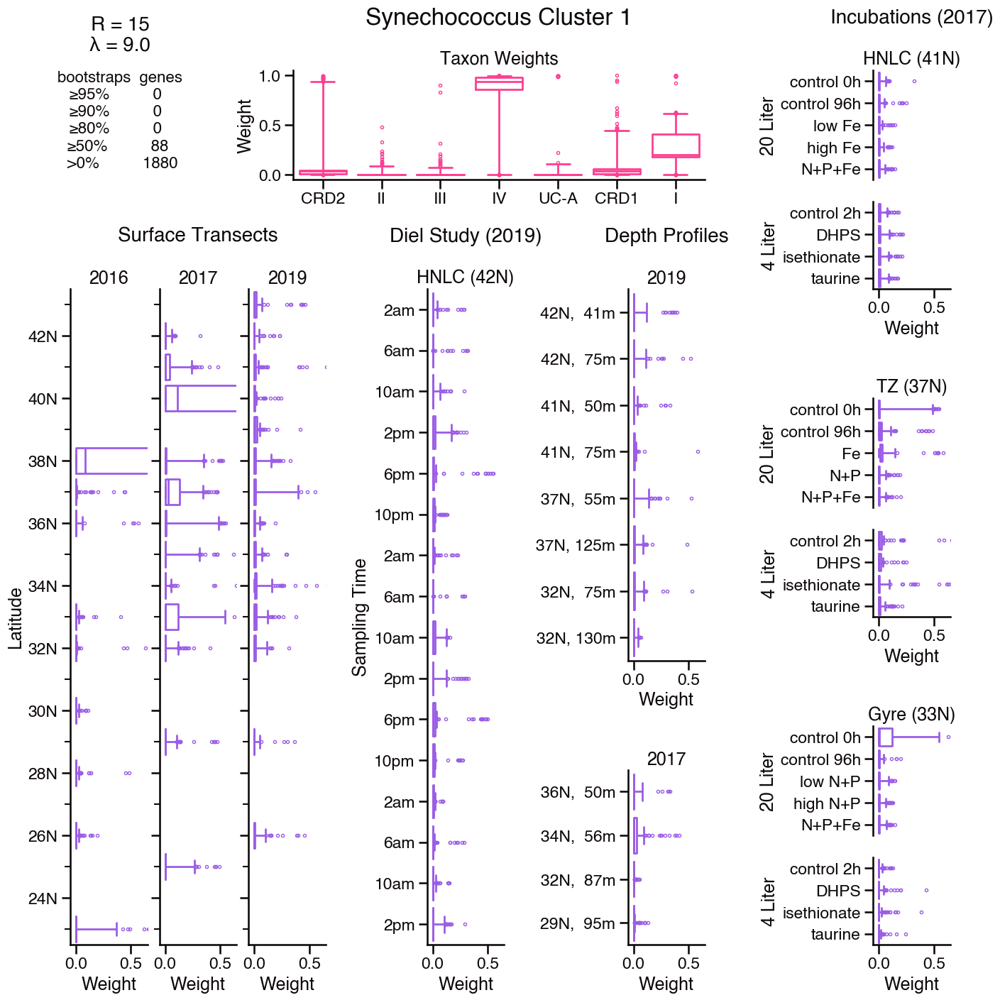

,Ortholog,MedianWeight,BootstrapSupport,Annotation
0,60002099,0.054018,0.536667,"DNA-binding response regulator, NarL/FixJ fami..."
1,60000460,0.041636,0.523333,Predicted component of the ribosome quality co...
2,60001465,0.041248,0.526667,ATP-dependent helicase Lhr and Lhr-like helicase
3,60002730,0.039247,0.523333,hypothetical protein
4,60004960,0.038567,0.523333,Glycosyl transferase family 2
5,60000292,0.037721,0.523333,"anthranilate synthase, component I"
6,60002175,0.037642,0.523333,Glycosyl transferase family 2
7,60004369,0.034750,0.530000,Glycosyltransferase involved in cell wall bisy...
8,60002201,0.034741,0.523333,Protein of unknown function (DUF3370)
9,60001957,0.033758,0.546667,Uncharacterized metal-binding protein


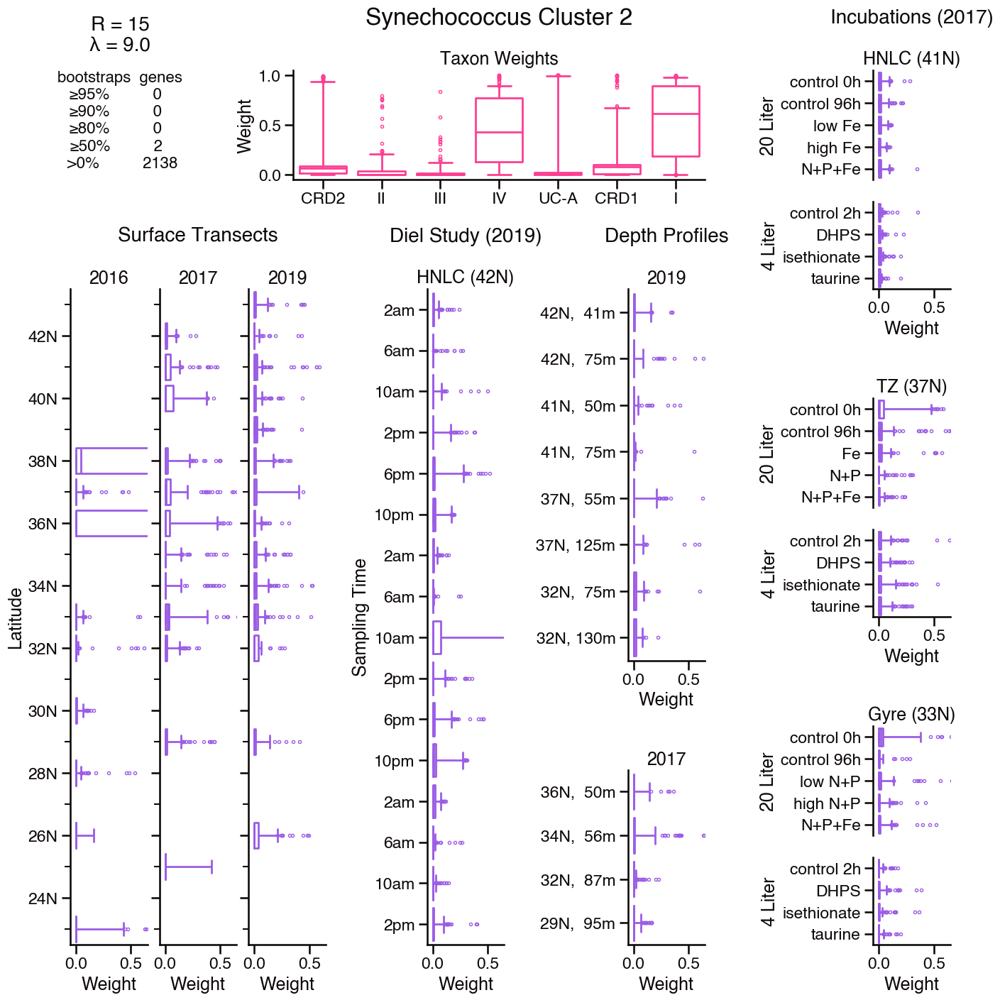

,Ortholog,MedianWeight,BootstrapSupport,Annotation
0,60000008,0.005034,0.516667,"serine protease, S1-C subfamily, contains C-te..."
1,60000038,0.000429,0.500000,Uncharacterized membrane protein


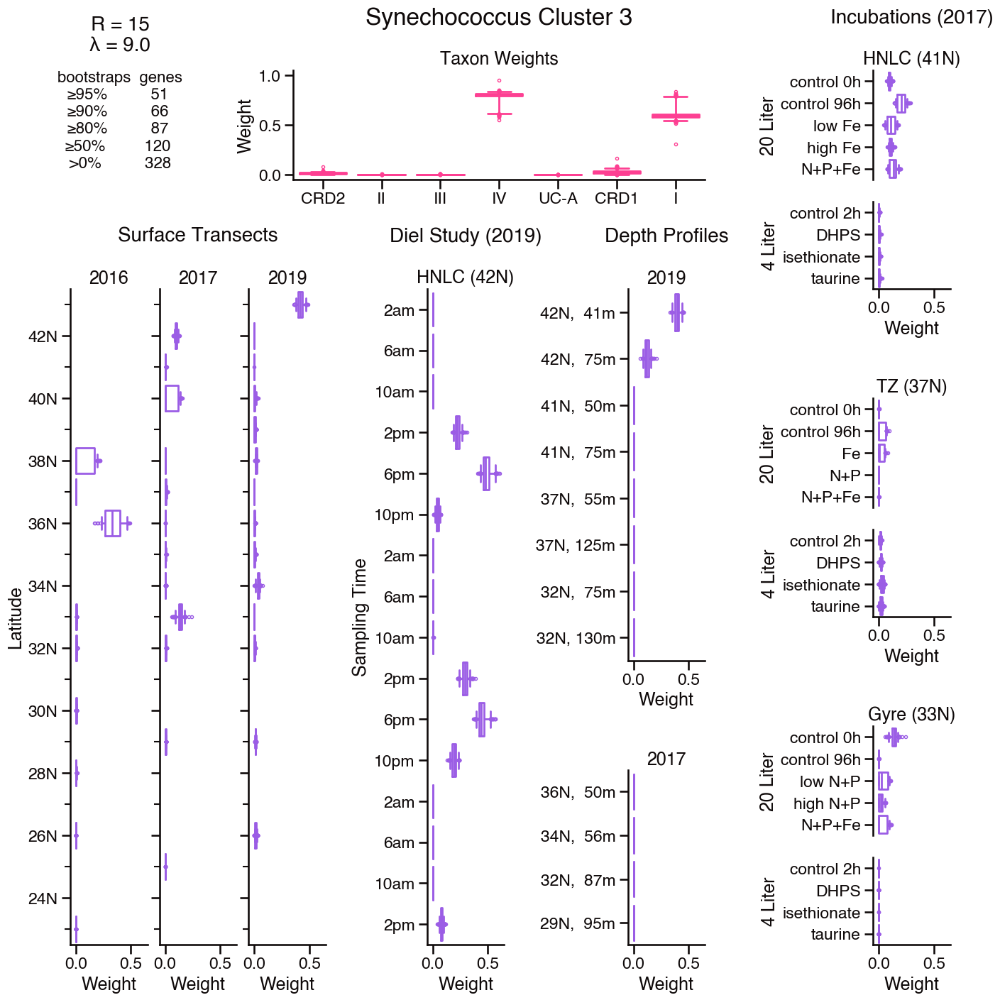

,Ortholog,MedianWeight,BootstrapSupport,Annotation
0,60000835,0.359015,1.000000,"RNA polymerase sigma factor, sigma-70 family"
1,60000067,0.324043,1.000000,cytochrome c oxidase subunit 2
2,60000041,0.319698,1.000000,cytochrome c oxidase subunit 1
3,60000573,0.214832,1.000000,6-phosphogluconate dehydrogenase (decarboxylat...
4,60000143,0.210028,1.000000,starch phosphorylase
5,60000194,0.204594,0.993333,cytochrome c oxidase assembly protein subunit 15
6,60003215,0.199169,1.000000,glyceraldehyde-3-phosphate dehydrogenase (NAD+)
7,60001088,0.190954,1.000000,ferredoxin protochlorophyllide reductase subun...
8,60003132,0.185881,1.000000,hypothetical protein
9,60000170,0.182747,1.000000,protoheme IX farnesyltransferase


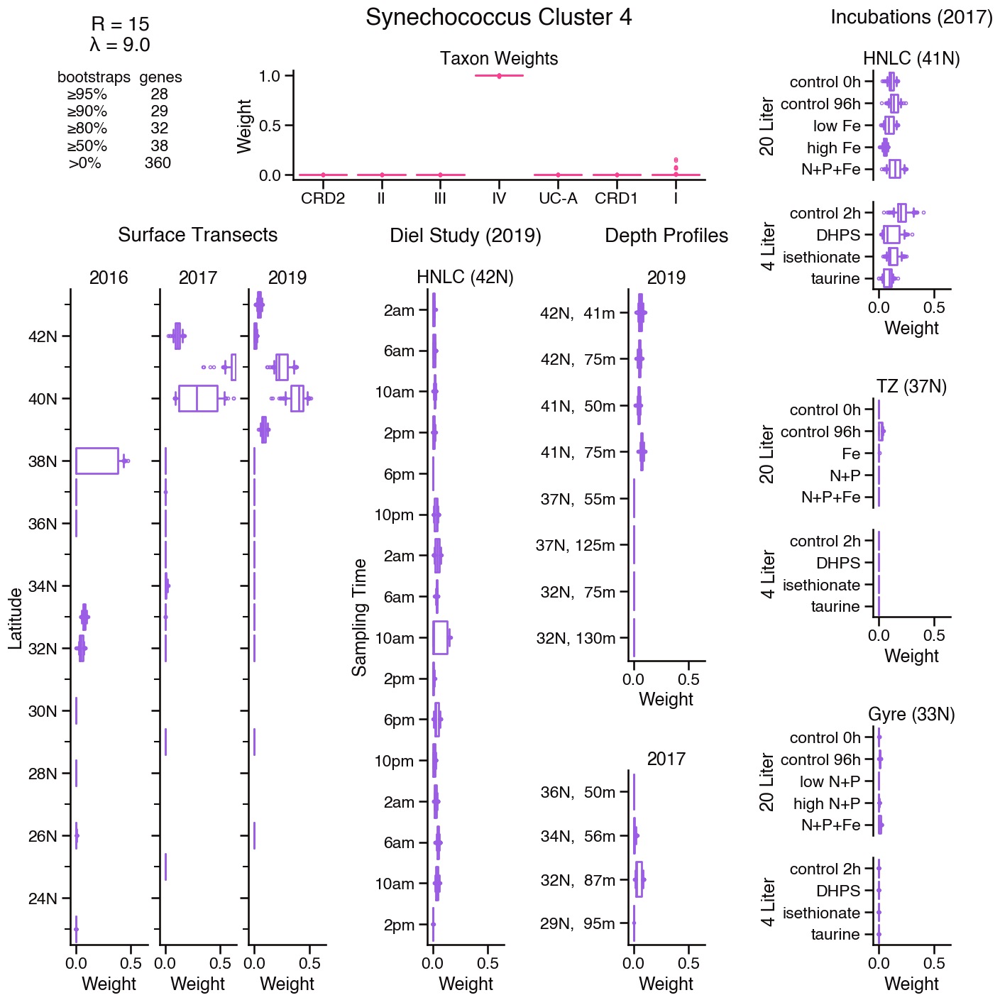

,Ortholog,MedianWeight,BootstrapSupport,Annotation
0,60021198,0.316154,0.996667,citronellol/citronellal dehydrogenase
1,60029856,0.292114,1.000000,periplasmic chaperone for outer membrane prote...
2,60032022,0.290006,0.993333,DNA-directed RNA polymerase subunit omega
3,60015661,0.283102,1.000000,ribulose-5-phosphate 3-epimerase
4,60022412,0.262670,1.000000,GTP pyrophosphokinase
5,60034122,0.238616,1.000000,O-sialoglycoprotein endopeptidase
6,60023953,0.225778,1.000000,RNAse PH
7,60035087,0.200522,1.000000,LPS assembly outer membrane protein LptD (orga...
8,60029520,0.184183,0.996667,dihydroneopterin aldolase
9,60029857,0.180379,1.000000,Phosphotransferase enzyme family protein


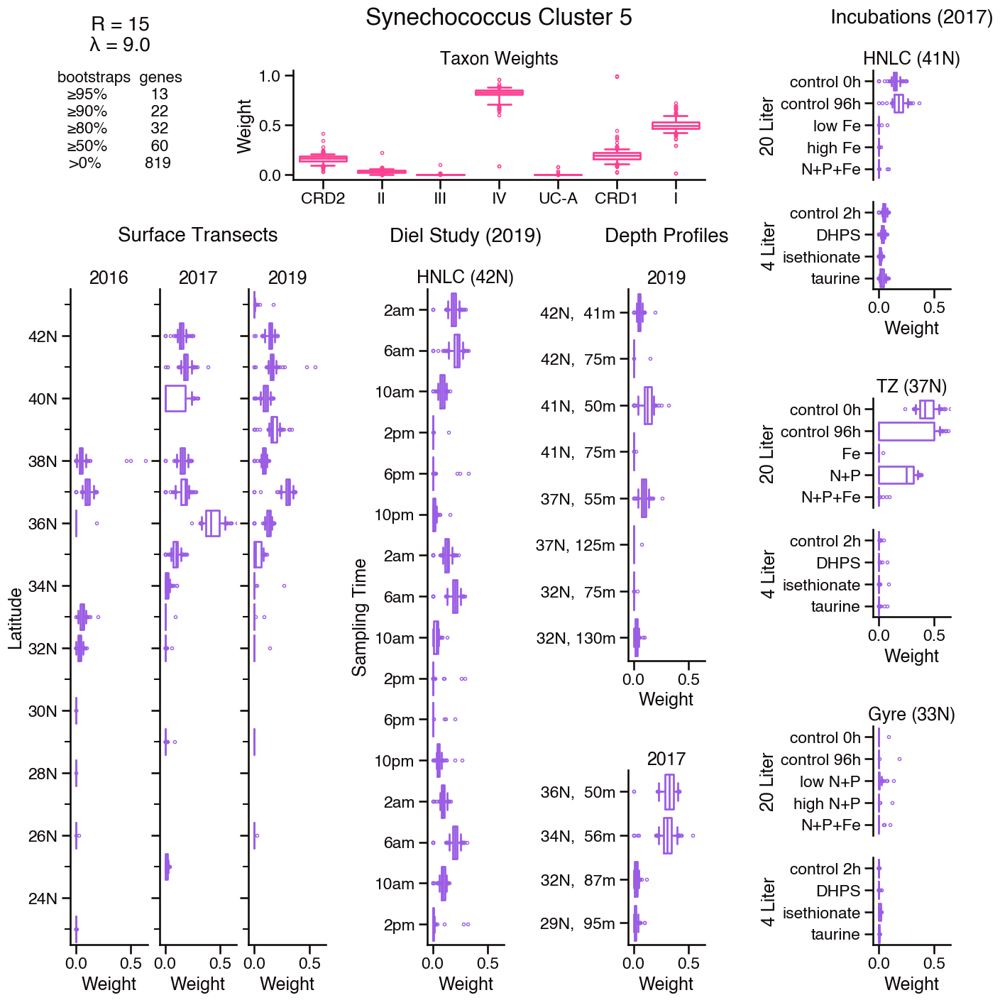

,Ortholog,MedianWeight,BootstrapSupport,Annotation
0,60001112,0.541896,0.986667,flavodoxin I
1,60000023,0.471844,0.983333,chlorophyll a/b binding light-harvesting prote...
2,60001290,0.430921,0.966667,fructose-bisphosphate aldolase
3,60002623,0.363704,0.990000,hypothetical protein
4,60002950,0.128289,0.980000,Pimeloyl-ACP methyl ester carboxylesterase
5,60000706,0.103289,0.983333,iron(III) transport system substrate-binding p...
6,60000103,0.093971,0.976667,thioredoxin reductase (NADPH)
7,60003170,0.093772,0.950000,hypothetical protein
8,60003640,0.081913,0.916667,hypothetical protein
9,60003403,0.080487,0.926667,"Uncharacterized membrane protein YphA, DoxX/SU..."


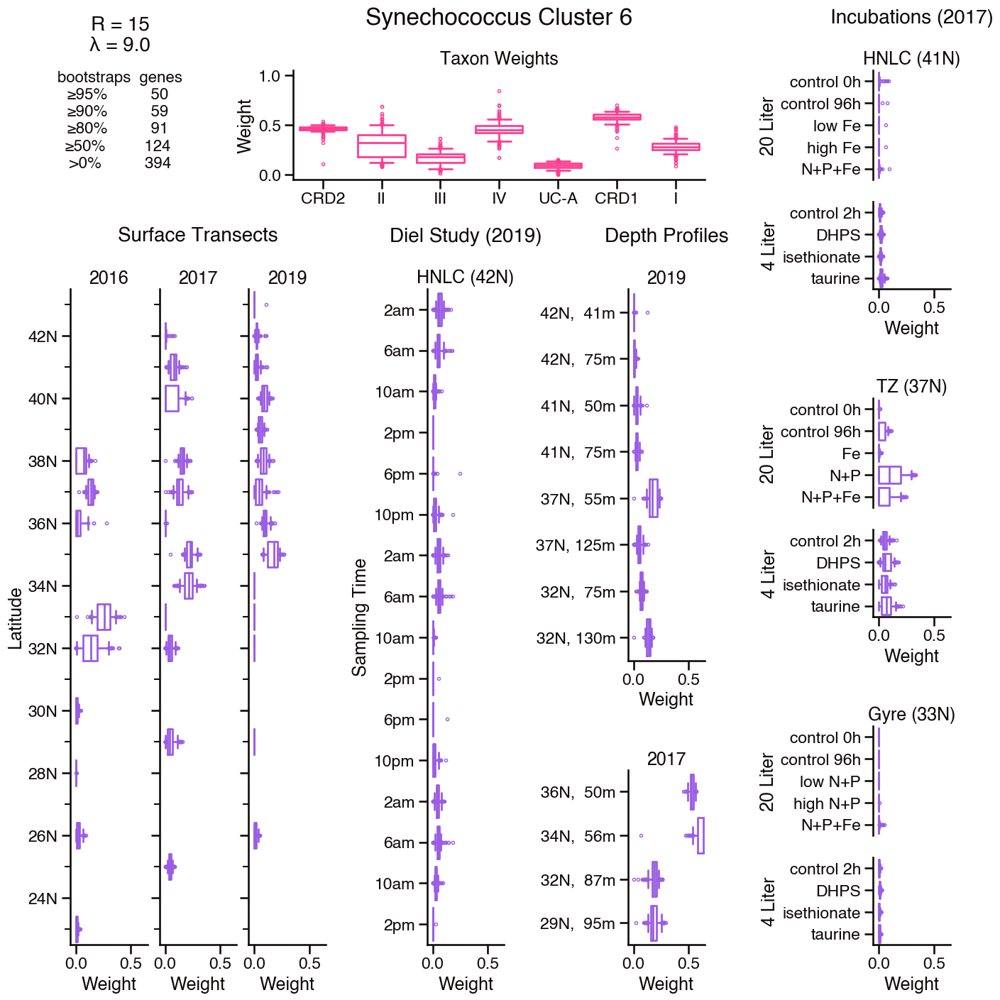

,Ortholog,MedianWeight,BootstrapSupport,Annotation
0,60001290,0.290572,0.873333,fructose-bisphosphate aldolase
1,60000978,0.272239,0.996667,"ribulose 1,5-bisphosphate carboxylase large su..."
2,60000836,0.261431,0.996667,"D-fructose 1,6-bisphosphatase /sedoheptulose 1..."
3,60000381,0.254659,0.950000,glyceraldehyde 3-phosphate dehydrogenase (NADP+)
4,60000742,0.237864,0.993333,ATP synthase F0 subcomplex B' subunit
5,60000273,0.213698,0.976667,phosphoglycerate kinase
6,60001081,0.200984,0.996667,"ribulose 1,5-bisphosphate carboxylase small su..."
7,60000979,0.188982,0.996667,BMC domain-containing protein
8,60000691,0.161218,0.976667,phosphoribulokinase
9,60000507,0.161117,0.996667,ATP synthase F1 subcomplex alpha subunit


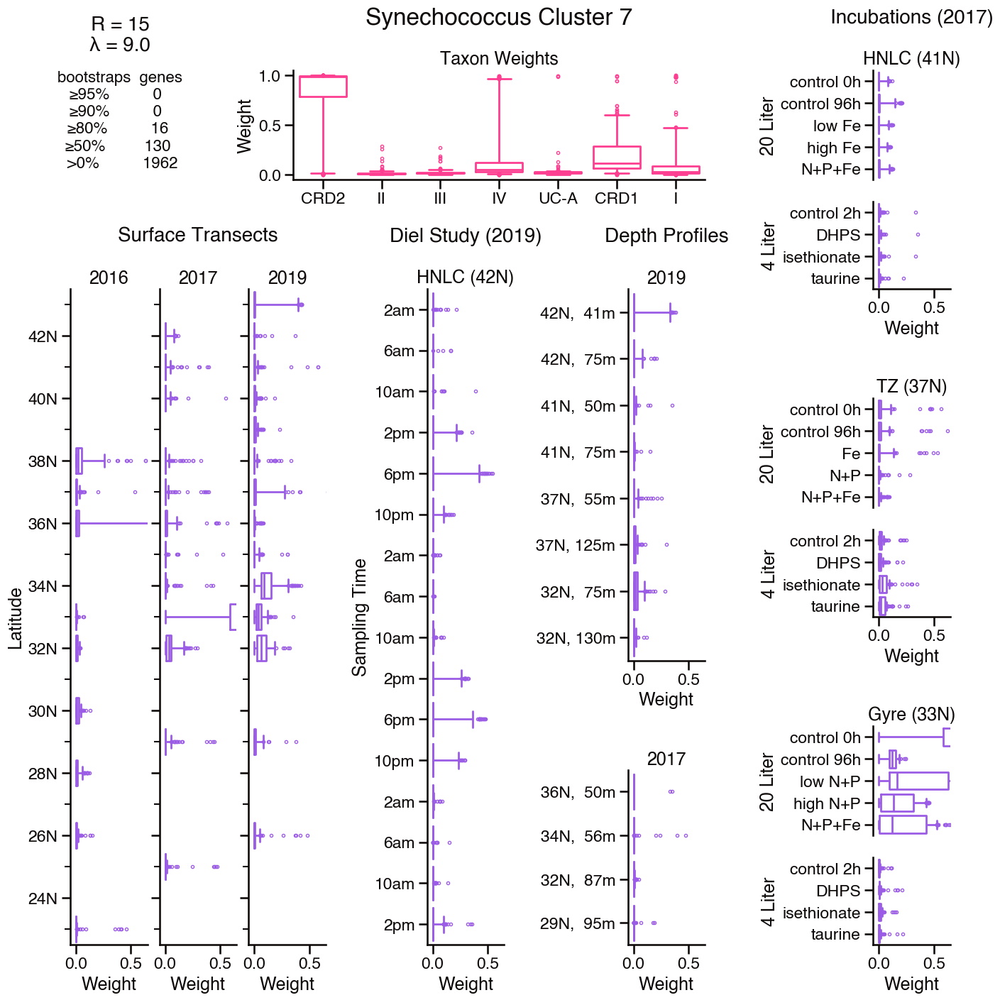

,Ortholog,MedianWeight,BootstrapSupport,Annotation
0,60004205,0.165265,0.846667,gluconolactonase
1,60004814,0.155490,0.830000,hypothetical protein
2,60003600,0.155400,0.790000,"Mannose or cellobiose epimerase, N-acyl-D-gluc..."
3,60004180,0.153816,0.793333,hypothetical protein
4,60005614,0.150762,0.753333,FG-GAP repeat-containing protein
5,60003709,0.147784,0.756667,glycogen operon protein
6,60000573,0.142499,0.823333,6-phosphogluconate dehydrogenase (decarboxylat...
7,60000595,0.135022,0.796667,transaldolase
8,60007574,0.134491,0.750000,Ketosteroid isomerase-related protein
9,60004700,0.129288,0.830000,Putative intracellular protease/amidase


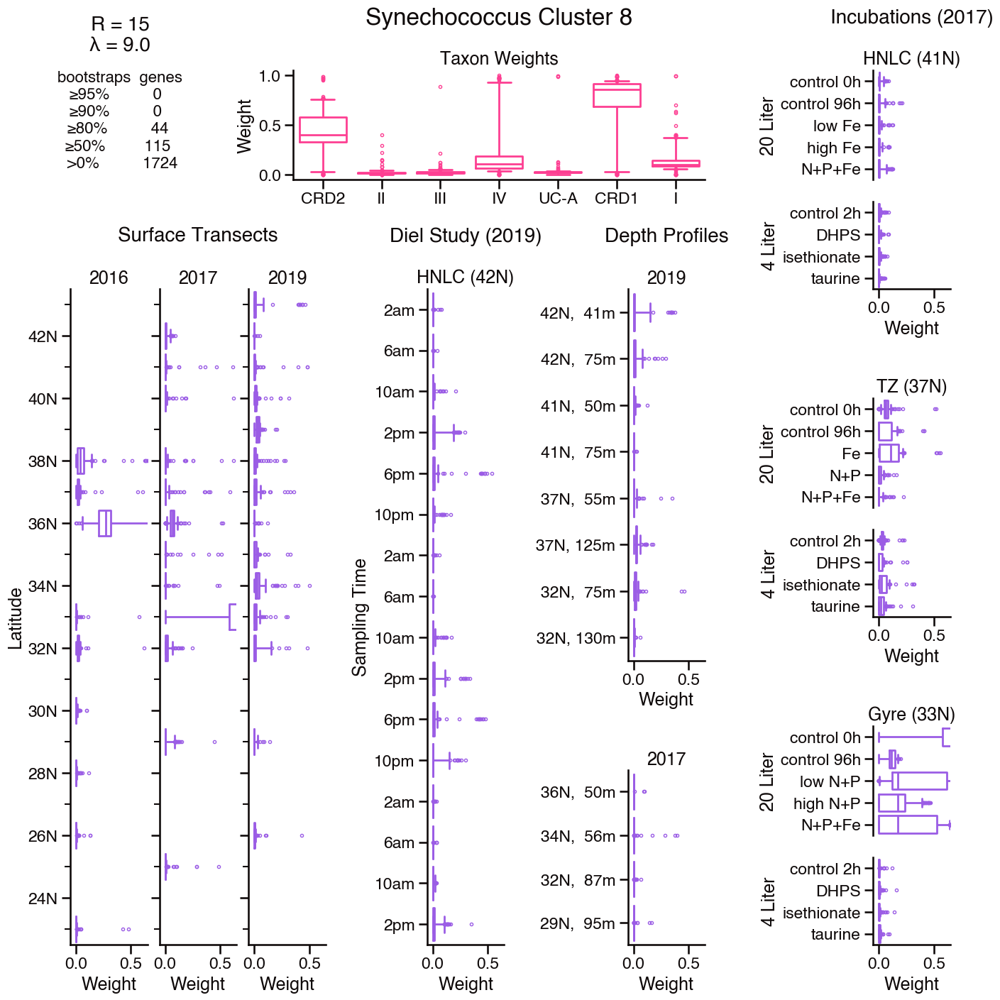

,Ortholog,MedianWeight,BootstrapSupport,Annotation
0,60000041,0.238140,0.853333,cytochrome c oxidase subunit 1
1,60000194,0.219136,0.836667,cytochrome c oxidase assembly protein subunit 15
2,60000067,0.204956,0.826667,cytochrome c oxidase subunit 2
3,60000835,0.201497,0.823333,"RNA polymerase sigma factor, sigma-70 family"
4,60000170,0.201066,0.830000,protoheme IX farnesyltransferase
5,60000247,0.199860,0.863333,NADH dehydrogenase subunit M
6,60000077,0.182651,0.810000,cytochrome c oxidase subunit 3
7,60002241,0.141805,0.866667,hypothetical protein
8,60000105,0.134864,0.846667,ATP-dependent Clp protease ATP-binding subunit...
9,60000595,0.133258,0.806667,transaldolase


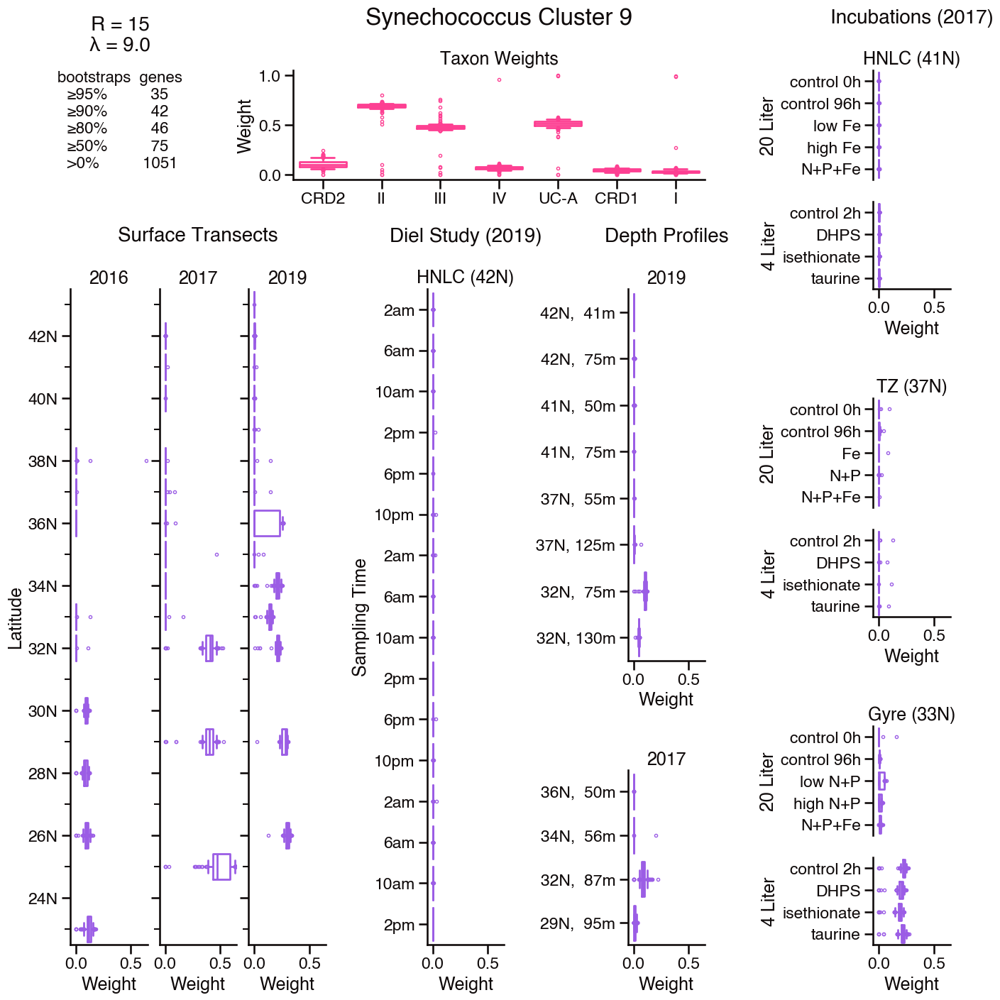

,Ortholog,MedianWeight,BootstrapSupport,Annotation
0,60002292,0.654141,0.986667,phycoerythrin-associated linker protein
1,60001652,0.384541,0.983333,phycoerythrin alpha chain
2,60001630,0.343100,0.980000,phycoerythrin beta chain
3,60000087,0.184386,0.983333,photosystem I P700 chlorophyll a apoprotein A1
4,60001535,0.166696,0.963333,protein of unknown function (DUF4278)
5,60000298,0.165461,0.966667,AbrB-like transcriptional regulator
6,60000501,0.140559,0.960000,photosystem I subunit 2
7,60000242,0.129933,0.983333,polyribonucleotide nucleotidyltransferase
8,60000650,0.115475,0.963333,photosystem I subunit 3
9,60000004,0.113767,0.980000,hypothetical protein


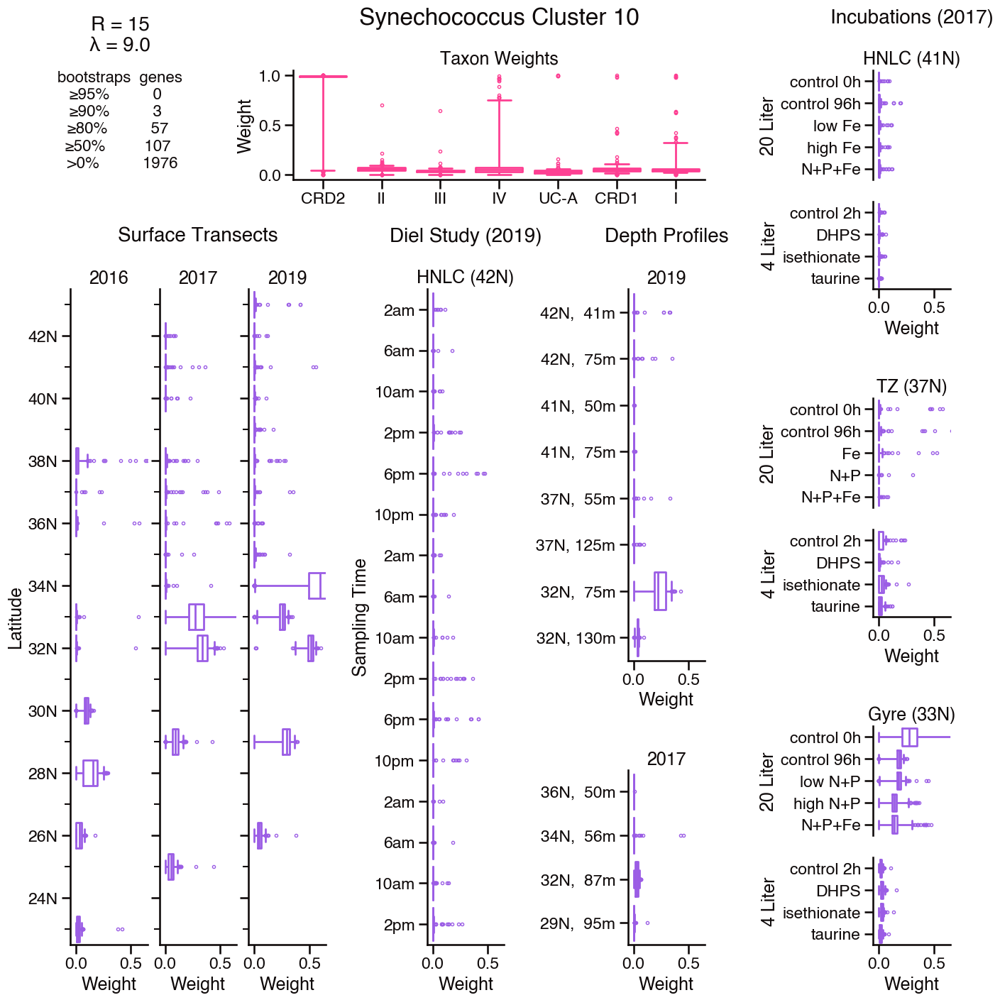

,Ortholog,MedianWeight,BootstrapSupport,Annotation
0,60030679,0.296053,0.876667,hypothetical protein
1,60004183,0.267282,0.880000,formamidase
2,60004832,0.259998,0.880000,hypothetical protein
3,60004204,0.209724,0.876667,protein of unknown function (DUF4278)
4,60005716,0.198527,0.876667,hypothetical protein
5,60005623,0.187077,0.870000,hypothetical protein
6,60003149,0.168365,0.876667,hypothetical protein
7,60000285,0.156439,0.916667,hypothetical protein
8,60010252,0.142020,0.873333,hypothetical protein
9,60000541,0.140668,0.893333,hypothetical protein


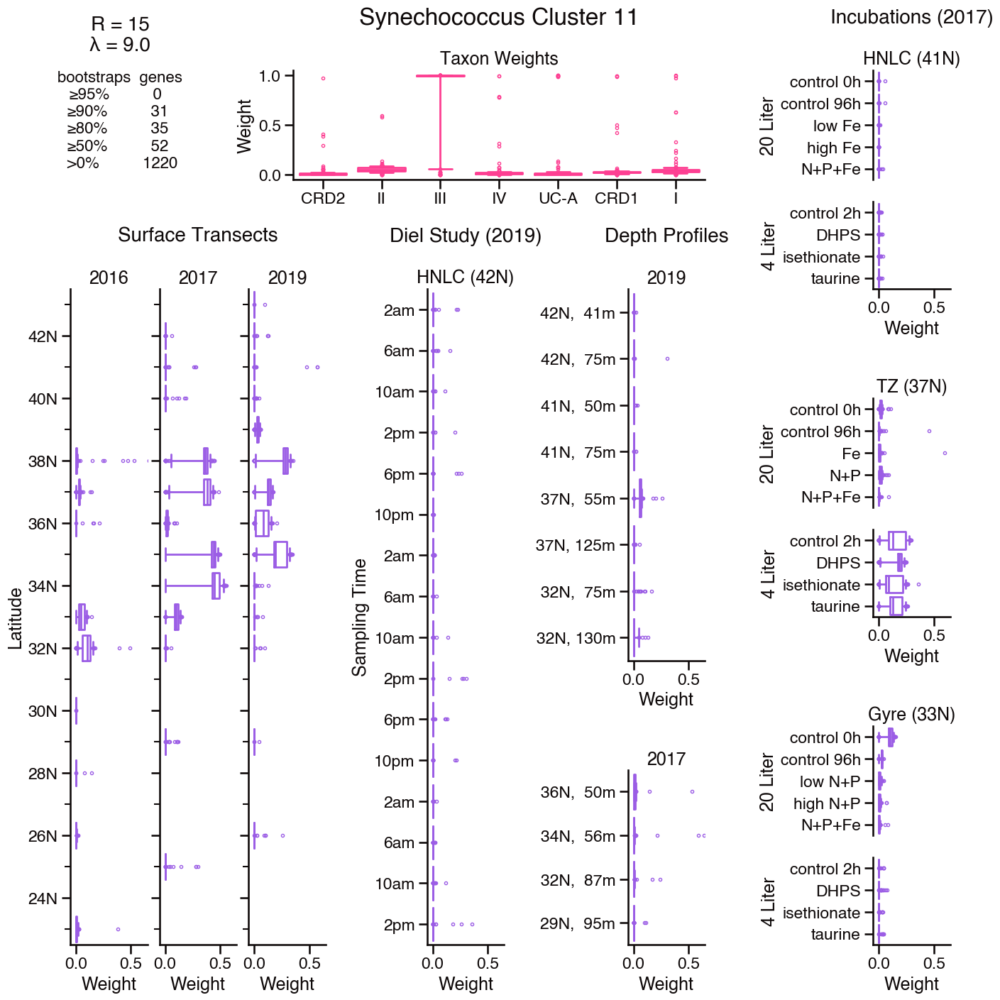

,Ortholog,MedianWeight,BootstrapSupport,Annotation
0,60009898,0.377141,0.926667,Predicted O-linked N-acetylglucosamine transfe...
1,60004866,0.347771,0.926667,"ATP-binding cassette, subfamily B"
2,60011407,0.333287,0.926667,Domain of unknown function (DUF4915)
3,60004369,0.272978,0.933333,Glycosyltransferase involved in cell wall bisy...
4,60001471,0.213941,0.926667,polysaccharide export outer membrane protein
5,60001332,0.196803,0.930000,"GDPmannose 4,6-dehydratase"
6,60000933,0.194045,0.926667,quinolinate synthetase
7,60000308,0.191884,0.933333,aspartyl-tRNA synthetase
8,60001495,0.174722,0.930000,"NDP-sugar epimerase, includes UDP-GlcNAc-inver..."
9,60003260,0.173708,0.926667,Glycosyltransferase sugar-binding region conta...


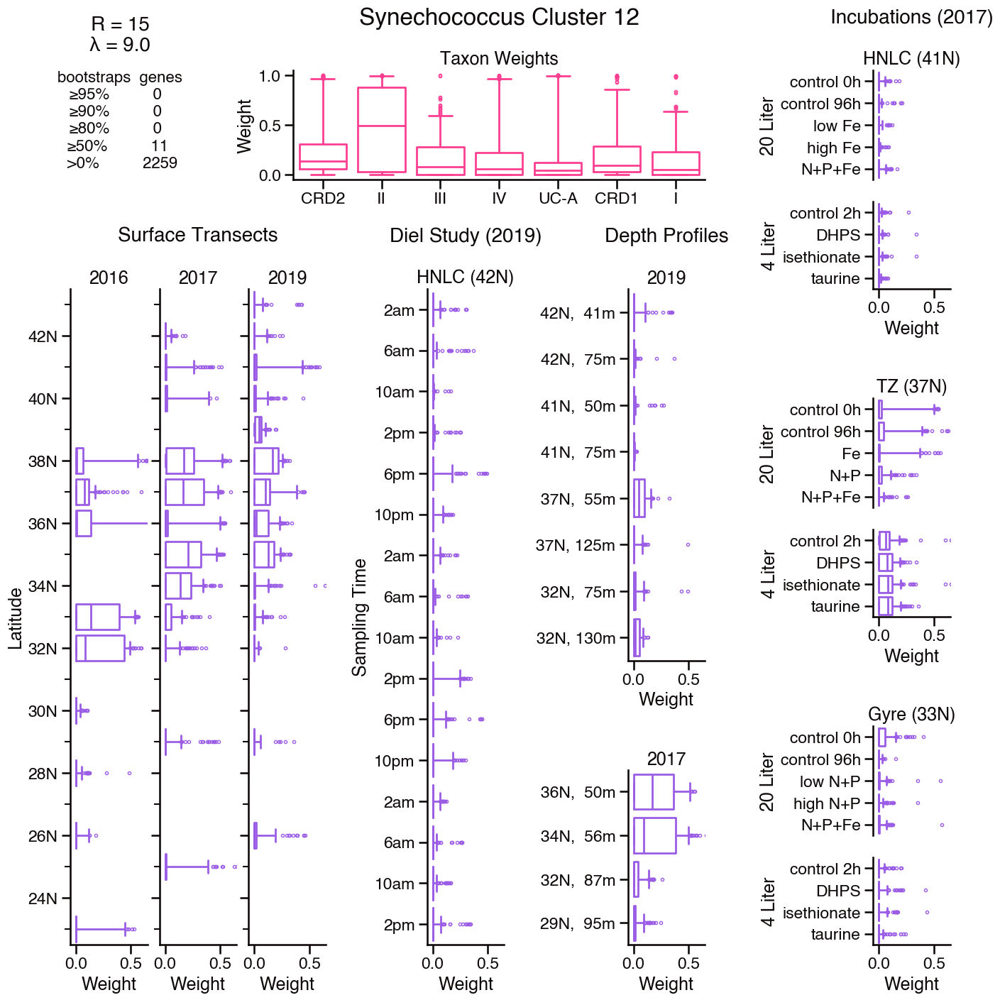

,Ortholog,MedianWeight,BootstrapSupport,Annotation
0,60001290,0.212201,0.560000,fructose-bisphosphate aldolase
1,60000979,0.068020,0.546667,BMC domain-containing protein
2,60000624,0.045370,0.526667,ATP synthase F0 subcomplex A subunit
3,60001058,0.030470,0.536667,SSU ribosomal protein S2P
4,60000005,0.020101,0.546667,chaperonin GroEL
5,60000166,0.015012,0.536667,nucleoside diphosphate kinase
6,60000321,0.011115,0.526667,inorganic pyrophosphatase
7,60001081,0.008707,0.526667,"ribulose 1,5-bisphosphate carboxylase small su..."
8,60000567,0.002205,0.503333,LSU ribosomal protein L10P
9,60000129,0.001139,0.503333,"transcriptional regulator, GntR family"


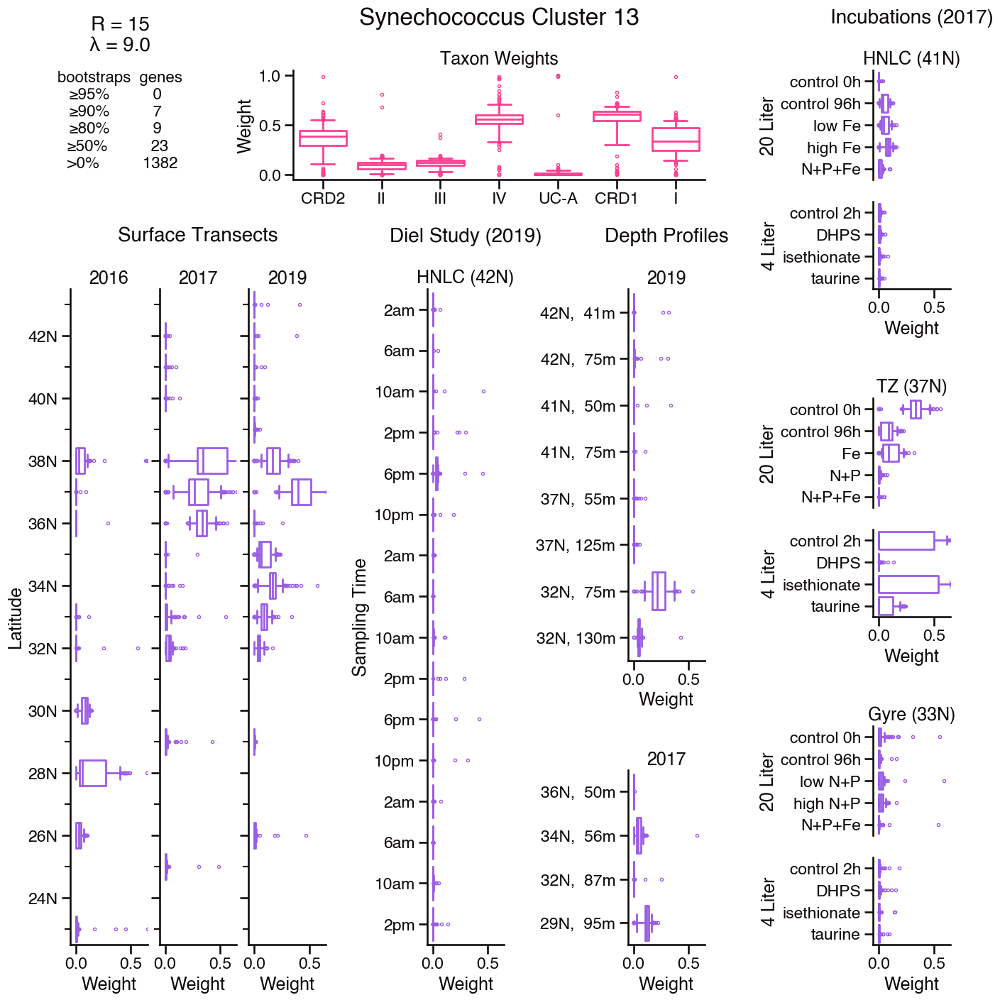

,Ortholog,MedianWeight,BootstrapSupport,Annotation
0,60001296,0.577559,0.943333,urea-binding protein
1,60001803,0.441069,0.943333,formate/nitrite transporter
2,60001886,0.362875,0.943333,"MFS transporter, NNP family, nitrate/nitrite t..."
3,60001979,0.320613,0.943333,cyanate lyase
4,60000113,0.285291,0.946667,ammonium transporter
5,60001560,0.171625,0.940000,assimilatory nitrite reductase (ferredoxin) pr...
6,60001300,0.112963,0.920000,urea ABC transporter membrane protein
7,60001877,0.097233,0.810000,assimilatory nitrate reductase (ferredoxin) pr...
8,60002822,0.087895,0.780000,glucosyl-3-phosphoglycerate synthase
9,60001295,0.063217,0.766667,urea ABC transporter membrane protein


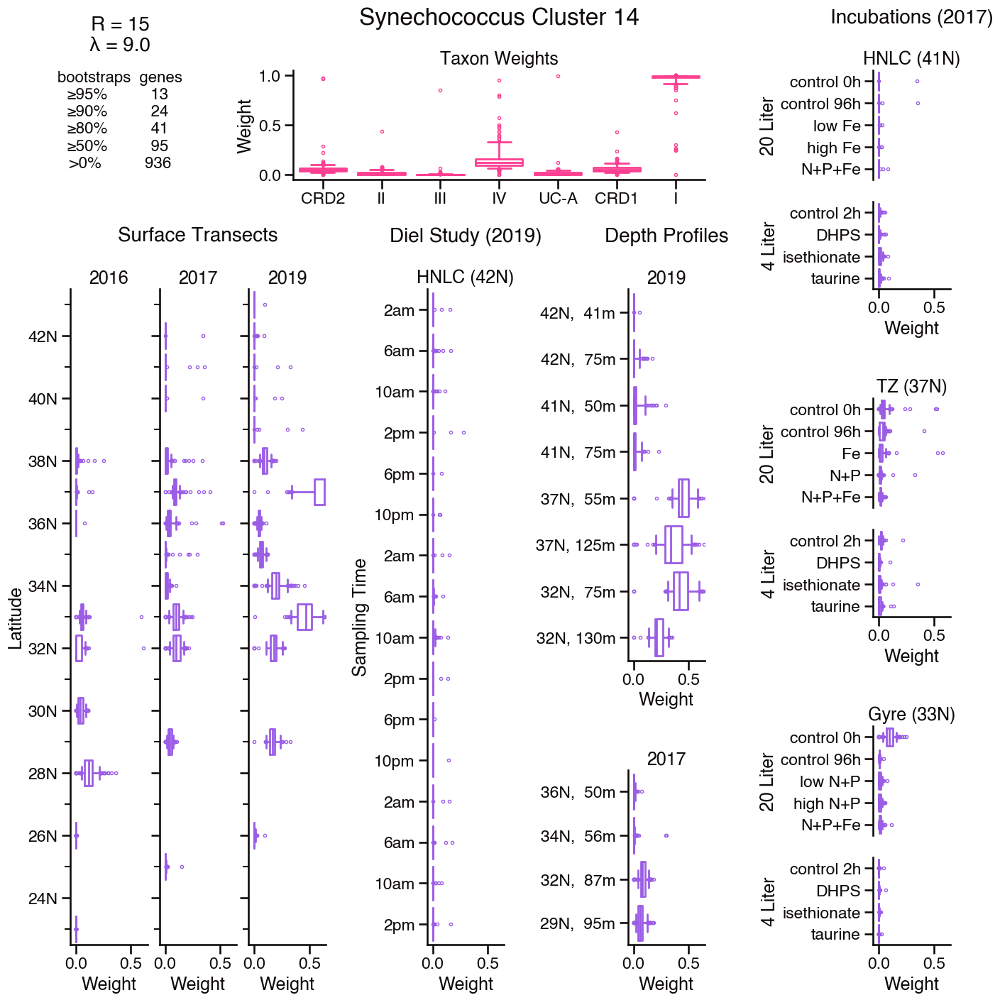

,Ortholog,MedianWeight,BootstrapSupport,Annotation
0,60001007,0.373637,0.970000,Ferritin
1,60001666,0.332430,0.980000,ATP synthase protein I
2,60000624,0.299203,0.973333,ATP synthase F0 subcomplex A subunit
3,60002711,0.216743,0.970000,phycobilisome core-membrane linker protein
4,60006037,0.196546,0.970000,hypothetical protein
5,60001240,0.181997,0.963333,hypothetical protein
6,60006409,0.177514,0.970000,photosystem I subunit 10
7,60002794,0.144955,0.963333,Nitrogen fixation protein of unknown function
8,60003427,0.113015,0.930000,transport factor 2 (NTF2) domain-containing pr...
9,60002649,0.110963,0.910000,HSP20 family protein


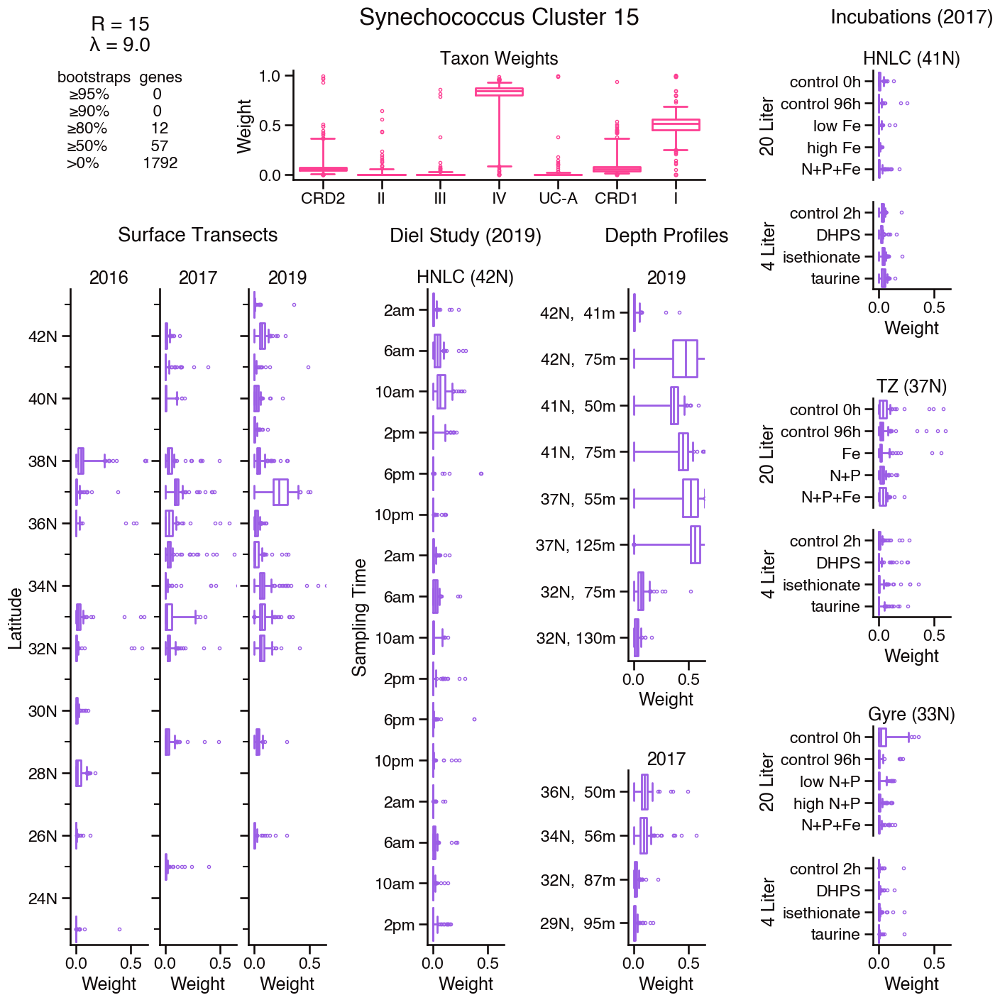

,Ortholog,MedianWeight,BootstrapSupport,Annotation
0,60002794,0.449393,0.856667,Nitrogen fixation protein of unknown function
1,60002624,0.310669,0.823333,HEAT repeat-containing protein
2,60001433,0.253282,0.806667,hypothetical protein
3,60003153,0.250904,0.806667,hypothetical protein
4,60003368,0.196694,0.836667,hypothetical protein
5,60003427,0.191876,0.790000,transport factor 2 (NTF2) domain-containing pr...
6,60002769,0.187856,0.810000,hypothetical protein
7,60003618,0.171944,0.773333,nif11-like leader peptide domain-containing pr...
8,60001287,0.163803,0.796667,fructose-bisphosphate aldolase
9,60003202,0.115389,0.840000,hypothetical protein


In [7]:
# plot and save Syn clusters

# data and figure specs
genus = 'syn'
ds = {'pro': pro_ds, 'syn': syn_ds}[genus]
rank = ds.Rank
lamb = ds.Lambda
rows = 40
cols = 40
clade_color = {'pro': sns.color_palette()[2], 'syn': sns.color_palette()[3]}[genus]
sample_color = sns.color_palette()[0]
annot_kwgs = {
    'xycoords': 'axes fraction', 'va': 'center', 'ha': 'left', 'fontsize': 22, 'annotation_clip': False
}
sample_weight_range = (-0.05, 0.65)

# datapath
outdir = datapath / f'6-clusters/{genus}'
if not outdir.is_dir():
    outdir.mkdir(parents=True)
    
# iterate through clusters
for cluster in ds.Component.to_series():
    
    # set up data
    sampleweight_df = pd.merge(
        left=ds.SampleWeight.sel(Component=cluster).to_series().reset_index(), 
        right=metadata_df, 
        on='SampleName', 
        how='left'
    )
    taxonweight_df = ds.TaxonWeight.sel(Component=cluster).to_series().reset_index()
    taxonweight_df['Clade'] = taxonweight_df['Clade'].map(clade_display_names)
    geneweight_df = ds.GeneWeight.sel(Component=cluster).to_series().reset_index()
    geneweight_df['Nonzero'] = (geneweight_df.GeneWeight != 0.)
    geneweight_df = geneweight_df.groupby('Ortholog').agg(
        MedianWeight=('GeneWeight', 'median'), 
        BootstrapSupport=('Nonzero', 'mean')
    ).reset_index()
    geneweight_df = pd.merge(
        geneweight_df[geneweight_df['BootstrapSupport'].gt(0.)], ds.Annotation.to_series(), on='Ortholog', how='left'
    ).sort_values(['MedianWeight', 'BootstrapSupport'], ascending=False).reset_index(drop=True)

    # set up figure
    fig = plt.figure(figsize=(16, 16))
    grid = plt.GridSpec(rows, cols, wspace=1.2, hspace=0)
    
    # annotate with gene information
    axis = plt.subplot(grid[:5, :8])
    axis.set_axis_off()
    axis.annotate(
        'R = {}\nλ = {}'.format(rank, lamb), 
        xy=(0.3, 1.5), xycoords='axes fraction', va='top', ha='center', fontsize=20
    )
    boot_stats = geneweight_df['BootstrapSupport']
    axis.annotate(
        'bootstraps  genes\n{:^13}{:^12}\n{:^13}{:^12}\n{:^13}{:^12}\n{:^13}{:^12}\n{:^14}{:^12}'.format(
            '≥95%', boot_stats.ge(0.95).sum(), '≥90%', boot_stats.ge(0.9).sum(), '≥80%', boot_stats.ge(0.8).sum(), 
            '≥50%', boot_stats.ge(0.5).sum(), '>0%', boot_stats.gt(0.0).sum()), 
        xy=(0.3, 1.0), xycoords='axes fraction', va='top', ha='center', fontsize=16
    )
    
    # plot clade data
    axis = plt.subplot(grid[:5, 10:29])
    axis.annotate('{} Cluster {}'.format({'pro': 'Prochlorococcus', 'syn': 'Synechococcus'}[genus], cluster), 
                  xy=(0.5, 1.48), xycoords='axes fraction', va='center', ha='center', fontsize=24)
    plot_df = taxonweight_df
    sns.boxplot(
        data=plot_df, x='Clade', y='TaxonWeight', color=clade_color, fill=False, whis=(5, 95), fliersize=3, legend=False, ax=axis
    )
    axis.set(title='Taxon Weights', xlabel='', ylabel='Weight', ylim=(-0.05, 1.05))
    
    # plot surface transect data
    n_bins = 21
    bounds = (23, 43)
    major_tick_labels = ([2.5, 7.5, 12.5, 17.5], ['25N', '30N', '35N', '40N']) 
    for i, year in enumerate([2016, 2017, 2019]):
        axis = plt.subplot(grid[10:, 4*i:4*i+4])
        if i == 1:
            axis.annotate('Surface Transects', xy=(.5, 1.08), xycoords='axes fraction', va='center', ha='center', fontsize=20)
        # plot community composition
        plot_df = sampleweight_df[(sampleweight_df['Year'] == year) & (sampleweight_df['SampleGroup'] == 'surface transect')]
        latitudes = plot_df[
            ['SampleName', 'Latitude']].drop_duplicates().set_index('SampleName').sort_values('Latitude')['Latitude']
        lat_bins = unique_bins(latitudes, n_bins, bounds=bounds, reverse=False)
        plot_df['lat_idx'] = plot_df['SampleName'].map(dict(zip(latitudes.index, lat_bins)))
        sns.boxplot(
            data=plot_df, x='SampleWeight', y='lat_idx', color=sample_color, order=np.arange(n_bins), 
            orient='y', fill=False, whis=(5, 95), fliersize=3, legend=False, ax=axis
        )
        if not i:
            axis.set_yticks(np.arange(1, n_bins, 2), [f'{l}N' for l in np.arange(bounds[0]+1, bounds[1], 2)])
            axis.set(xlabel='Weight', ylabel='Latitude', xlim=sample_weight_range, ylim=(-0.5, n_bins-0.5), title=year)
        else: 
            axis.set_yticks(np.arange(1, n_bins, 2))
            axis.tick_params(labelleft=False)
            axis.set(xlabel='Weight', ylabel='', xlim=sample_weight_range, ylim=(-0.5, n_bins-0.5), title=year)
        axis.set_yticks(np.arange(n_bins), minor=True)
    
    # plot diel data
    axis = plt.subplot(grid[10:, 16:20])
    axis.annotate('Diel Study (2019)', xy=(0.5, 1.08), xycoords='axes fraction', va='center', ha='center', fontsize=20)
    # plot community composition
    plot_df = sampleweight_df[sampleweight_df['SampleGroup'] == 'diel study'].sort_values('Datetime', ascending=False)
    n_samples = plot_df['SampleName'].nunique()
    plot_df['idx'] = plot_df['SampleName'].map(dict(zip(plot_df['SampleName'].unique(), np.arange(n_samples))))
    sns.boxplot(
        data=plot_df, x='SampleWeight', y='idx', color=sample_color, 
        orient='y', fill=False, whis=(5, 95), fliersize=3, legend=False, ax=axis
    )
    axis.set(xlabel='Weight', ylabel='Sampling Time', xlim=sample_weight_range, ylim=(-0.5, n_samples-0.5), title='HNLC (42N)')
    axis.set_yticks(np.arange(n_samples), plot_df[['SampleName', 'TimeClass']].drop_duplicates()['TimeClass']);
    
    # plot depth data
    for i, year in enumerate([2019, 2017]):
        axis = plt.subplot(grid[10+(i*22):27+(i*23), 25:29])
        if not i:
            axis.annotate('Depth Profiles', xy=(0.5, 1.141), xycoords='axes fraction', va='center', ha='center', fontsize=20)
        # plot community composition
        plot_df = sampleweight_df[(sampleweight_df['SampleGroup'] == 'depth profiles') & (sampleweight_df['Year'] == year)].sort_values(
            ['Latitude', 'Depth'], ascending=[True, False])
        n_samples = plot_df['SampleName'].nunique()
        plot_df['idx'] = plot_df['SampleName'].map(dict(zip(plot_df['SampleName'].unique(), np.arange(n_samples))))
        sns.boxplot(
            data=plot_df, x='SampleWeight', y='idx', color=sample_color, 
            orient='y', fill=False, whis=(5, 95), fliersize=3, legend=False, ax=axis
        )
        axis.set(xlabel='Weight', ylabel='', xlim=sample_weight_range, ylim=(-0.5, n_samples-0.5), title=year)
        label_df = plot_df[['SampleName', 'Depth', 'Latitude']].drop_duplicates()
        labels = [f"{int(r['Latitude'])}N,{r['Depth']:4}m" for _, r in label_df.iterrows()]
        axis.set_yticks(np.arange(n_samples), labels);
    
    # plot incubation data
    incubation_treatment_order = {
        'HNLC': {'rr': ['control 0h', 'control 96h', 'low Fe', 'high Fe', 'N+P+Fe'], 'bryn': ['control 2h', 'DHPS', 'isethionate', 'taurine']}, 
        'TZ': {'rr': ['control 0h', 'control 96h', 'Fe', 'N+P', 'N+P+Fe'], 'bryn': ['control 2h', 'DHPS', 'isethionate', 'taurine']}, 
        'gyre': {'rr': ['control 0h', 'control 96h', 'low N+P', 'high N+P', 'N+P+Fe'], 'bryn': ['control 2h', 'DHPS', 'isethionate', 'taurine']}
    }
    for i, condition in enumerate(['HNLC', 'TZ', 'gyre']):
        axtop = plt.subplot(grid[15*i:5+(15*i), 36:40]) # 0:5, 15:20, 30:35
        axbottom = plt.subplot(grid[6+(15*i):10+(15*i), 36:40]) # 6:10, 21:25, 36:40
        # plot community composition
        data_df = sampleweight_df[sampleweight_df['Condition'] == condition]
        # plot resource ratio on top and sulfur amendments on bottom
        for dataset in ['rr', 'bryn']:
            axis = {'rr': axtop, 'bryn': axbottom}[dataset]
            if dataset == 'rr':
                plot_df = data_df[data_df['Dataset'] != 'Bryn amendment incubation']
                # label dataset
                if not i:
                    axis.annotate('Incubations (2017)', xy=(0.5, 1.48), xycoords='axes fraction', 
                                  va='center', ha='center', fontsize=20)
            elif dataset == 'bryn': 
                plot_df = data_df[data_df['Dataset'] == 'Bryn amendment incubation']
            plot_df['Treatment'] = pd.Categorical(plot_df['Treatment'], incubation_treatment_order[condition][dataset])
            sns.boxplot(
                data=plot_df.sort_values('Treatment'), x='SampleWeight', y='Treatment', color=sample_color, 
                orient='y', fill=False, whis=(5, 95), fliersize=3, legend=False, ax=axis
            )
            if dataset == 'rr':
                axis.set(xlabel='', ylabel='20 Liter', xlim=sample_weight_range, 
                         title={'HNLC': 'HNLC (41N)', 'TZ': 'TZ (37N)', 'gyre': 'Gyre (33N)'}[condition])
                axis.spines[['bottom']].set_visible(False)
                axis.tick_params(bottom=False, labelbottom=False)
            elif dataset == 'bryn':
                axis.set(xlabel='Weight', ylabel='4 Liter', xlim=sample_weight_range)
    
    # save/show figure
    fig.savefig(outdir / '{}{}-cluster-profile.png'.format(genus, cluster), bbox_inches='tight')
    plt.show()

    # save/show gene weights
    geneweight_df.to_csv(outdir / '{}{}-gene-weights.csv'.format(genus, cluster), index=False)
    display(geneweight_df[geneweight_df.MedianWeight != 0.].head(20))
